In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.api import VAR
from tqdm import tqdm
from statsmodels.tools.eval_measures import rmse, aic
import statsmodels.api as sm
from statsmodels.tsa.tsatools import lagmat
from statsmodels.distributions.empirical_distribution import ECDF
import networkx as nx

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
data_stock = pd.read_csv("drive/MyDrive/Project_5/data/stock_30min_official_trading_filled_missing(ffill).csv")
data_crypto = pd.read_csv("drive/MyDrive/Project_5/data/crypto_30min_filled_missing_value(ffill).csv")
data_etf = pd.read_csv("drive/MyDrive/Project_5/data/etfs_filled.csv").drop(columns = ["Unnamed: 0"])
remove_assets = ["GOVT","IEF", "IEI", "UVXY", "VIXM", "VIXY","VXX"]
data_etf = data_etf.drop(columns = remove_assets)

In [4]:
# Set the index column of each dataset to "date"
data_crypto = data_crypto.set_index("date")
data_crypto_rm_UST = data_crypto.drop(columns = ["UST"])
data_stock = data_stock.set_index("date")
data_etf = data_etf.set_index("date")

In [5]:
# Get asset names
stock_names = list(data_stock.columns)
crypto_names = list(data_crypto.columns)
index_names = list(data_etf.columns)
asset_names = stock_names + crypto_names + index_names


crypto_names_rm_UST = list(data_crypto.drop(columns = ["UST"]).columns)

In [6]:
# 221 assets - without UST
all_data = pd.concat([data_stock, data_crypto_rm_UST, data_etf], axis =1, join = "inner")

In [7]:
data = all_data.to_numpy() # Convert to numpy
names = all_data.columns
# Find log-returns
original = data[:-1]
onelag = data[1:]
logreturns = np.log(onelag) - np.log(original)

return_data = pd.DataFrame(data = logreturns, columns = names)
return_data["date"] = all_data.reset_index()["date"][1:].values
return_data["date"] = pd.to_datetime(return_data["date"])
return_data = return_data.set_index(['date'])

In [8]:
# calculate the congation density
# if the density of each individual community is high and between different communities is low, then the contagion is a factor forming communities.
class contagion_metrics_within_community():
  '''
  Assess the contagion effect between assets within a community
  '''
  def __init__(self, data, pvalues = None):
    self.data = data # contagion result using VAR, should be this format: result.params
    self.pvalues = pvalues

  def data_process(self, lag_name):
    '''
    Appointing a specific lag
    '''
    data_copy = self.data.copy()
    if self.pvalues != None:
      data_copy[self.pvalues > 0.1] = 0.0

    if lag_name != None:
      data_specific_lag = data_copy.reset_index()
      data_specific_lag["lag"] = data_specific_lag["index"].apply(lambda x:x[-2:])
      data_specific_lag = data_specific_lag[data_specific_lag["lag"] == lag_name].drop(columns = ["lag"])
      data_specific_lag = data_specific_lag.set_index("index")
    else:
      data_specific_lag = data_copy

    try:
      data_specific_lag = data_specific_lag.drop("const")
    except:
      pass



    np.fill_diagonal(data_specific_lag.values, 0.0) # no self-contagion



    return data_specific_lag


  def contagion_density(self, lag_name = None):
    '''
    + Calculate the contagion density of a community (group)
    + density = #contagion directional edges/ #possible directional edges (between assets within the community). Note that the edge has two possible directions, in and out, which means that
      there are maximum 2 edges between two nodes.
    + We only consider the contagion effect from an asset to other different assets, self-contagion is ignored. Therefore, we turn the self-contagion values into zero 0.0.
    + For a NxN matrix, there are N(N-1) possible directional edges.
    + To calculate the number of contagion edges, just need to count the number of non-zero position in the matrix/dataframe.
    '''

    data_lag = self.data_process(lag_name)
    # density
    count_pos = sum(data_lag[data_lag > 0.0].count(axis = 1))
    count_neg = sum(data_lag[data_lag < 0.0].count(axis = 1))
    count_contagion = count_pos + count_neg
    num_possible_edges = len(data_lag)*(len(data_lag) -1)
    density_metric = count_contagion/num_possible_edges

    return density_metric * 100.0


  def average_contagion_magnitude(self, lag_name = None):
    data_lag = self.data_process(lag_name)
    data_lag_abs = data_lag.abs()
    num_contagion_edges = sum(data_lag_abs[data_lag_abs> 0.0].count(axis = 1))
    total_contagion = sum(data_lag_abs[data_lag_abs> 0.0].sum(axis = 1))
    average_magnitude = total_contagion/num_contagion_edges

    return average_magnitude


  def dominant_quantity_transmitter(self, lag_name = None):
    data_lag = self.data_process(lag_name)
    data_lag_abs = data_lag.abs()
    num_contagion_per_asset = data_lag_abs[data_lag_abs> 0.0].count(axis = 1).sort_values(ascending = False)
    return num_contagion_per_asset


  def dominant_magnitude_transmitter(self, lag_name = None):
    data_lag = self.data_process(lag_name)
    data_lag_abs = data_lag.abs()
    average_magnitude_contagion_per_asset = data_lag_abs[data_lag_abs> 0.0].mean(axis = 1).sort_values(ascending = False)
    return average_magnitude_contagion_per_asset


  def dominant_quantity_receiver(self, lag_name = None):
    data_lag = self.data_process(lag_name)
    data_lag_abs = data_lag.abs()
    num_contagion_per_asset = data_lag_abs[data_lag_abs> 0.0].count(axis = 0).sort_values(ascending = False)
    return num_contagion_per_asset


  def dominant_magnitude_receiver(self, lag_name = None):
    data_lag = self.data_process(lag_name)
    data_lag_abs = data_lag.abs()
    average_magnitude_contagion_per_asset = data_lag_abs[data_lag_abs> 0.0].mean(axis = 0).sort_values(ascending = False)
    return average_magnitude_contagion_per_asset

  def sub_group_contagion_density(self, list_assets, lag_name = None):
    data_lag = self.data_process(lag_name)
    sub_data = data_lag[list_assets].reset_index()
    sub_data["transmit"] = sub_data["index"].apply(lambda x: x[:-3])
    sub_data = sub_data.set_index("transmit").drop(columns = ["index"])
    sub_data = sub_data[sub_data.index.isin(list_assets)]

    count_pos = sum(sub_data[sub_data > 0.0].count(axis = 1))
    count_neg = sum(sub_data[sub_data < 0.0].count(axis = 1))
    count_contagion = count_pos + count_neg
    num_possible_edges = len(sub_data)*(len(sub_data) -1)
    density_metric = count_contagion/num_possible_edges

    return density_metric * 100.0





  def cross_contagion_density(self, list_asset1, list_asset2, lag_name = None):
    data_lag = self.data_process(lag_name) # contagion of all assets
    one_to_two = data_lag[list_asset2].reset_index()
    two_to_one = data_lag[list_asset1].reset_index()

    one_to_two["transmit"] = one_to_two["index"].apply(lambda x:x[:-3])
    two_to_one["transmit"] = two_to_one["index"].apply(lambda x:x[:-3])

    one_to_two = one_to_two.set_index("transmit").drop(columns = ["index"])
    one_to_two = one_to_two[one_to_two.index.isin(list_asset1)]
    two_to_one = two_to_one.set_index("transmit").drop(columns = ["index"])
    two_to_one = two_to_one[two_to_one.index.isin(list_asset2)]

    one_to_two_abs = one_to_two.abs()
    two_to_one_abs = two_to_one.abs()

    count_contagion_one_to_two = sum(one_to_two_abs[one_to_two_abs > 0.0].count(axis = 1))
    count_contagion_two_to_one = sum(two_to_one_abs[two_to_one_abs > 0.0].count(axis = 1))

    total_count = count_contagion_one_to_two + count_contagion_two_to_one

    num_possible_edges = 2*one_to_two_abs.shape[0]*one_to_two_abs.shape[1]

    density_metric =  total_count/num_possible_edges
    density_metric_one_to_two = 2*count_contagion_one_to_two/num_possible_edges
    density_metric_two_to_one = 2*count_contagion_two_to_one/num_possible_edges


    return density_metric*100.0, density_metric_one_to_two*100.0, density_metric_two_to_one*100.0


  def sub_group_magnitude(self, list_assets, lag_name = None):
    data_lag = self.data_process(lag_name)
    sub_data = data_lag[list_assets].reset_index()
    sub_data["transmit"] = sub_data["index"].apply(lambda x: x[:-3])
    sub_data = sub_data.set_index("transmit").drop(columns = ["index"])
    sub_data = sub_data[sub_data.index.isin(list_assets)]

    sub_data_abs = sub_data.abs()

    num_contagion_edges = sum(sub_data_abs[sub_data_abs> 0.0].count(axis = 1))
    total_contagion = sum(sub_data_abs[sub_data_abs> 0.0].sum(axis = 1))
    average_magnitude = total_contagion/num_contagion_edges

    return average_magnitude


  def cross_contagion_magnitude(self, list_asset1, list_asset2, lag_name = None):
    data_lag = self.data_process(lag_name) # contagion of all assets
    one_to_two = data_lag[list_asset2].reset_index()
    two_to_one = data_lag[list_asset1].reset_index()

    one_to_two["transmit"] = one_to_two["index"].apply(lambda x:x[:-3])
    two_to_one["transmit"] = two_to_one["index"].apply(lambda x:x[:-3])

    one_to_two = one_to_two.set_index("transmit").drop(columns = ["index"])
    one_to_two = one_to_two[one_to_two.index.isin(list_asset1)]
    two_to_one = two_to_one.set_index("transmit").drop(columns = ["index"])
    two_to_one = two_to_one[two_to_one.index.isin(list_asset2)]

    one_to_two_abs = one_to_two.abs()
    two_to_one_abs = two_to_one.abs()

    num_contagion_one_to_two = sum(one_to_two_abs[one_to_two_abs > 0.0].count(axis = 1))
    total_contagion_one_to_two = sum(one_to_two_abs[one_to_two_abs > 0.0].sum(axis = 1))

    num_contagion_two_to_one = sum(two_to_one_abs[two_to_one_abs > 0.0].count(axis = 1))
    total_contagion_two_to_one = sum(two_to_one_abs[two_to_one_abs > 0.0].sum(axis = 1))

    total_contagion = total_contagion_one_to_two + total_contagion_two_to_one
    num_contagion_edges = num_contagion_one_to_two + num_contagion_two_to_one

    average_magnitude = total_contagion/num_contagion_edges
    average_magnitude_one_to_two = total_contagion_one_to_two/num_contagion_one_to_two
    average_magnitude_two_to_one = total_contagion_two_to_one/num_contagion_two_to_one

    return average_magnitude, average_magnitude_one_to_two, average_magnitude_two_to_one















  # def specific_asset_to_others(self, lag_name):
  #   '''
  #   Calculate the contagion effect from one specific asset to other considered assets
  #   '''




In [9]:

def single_VAR(df, target_asset, n_lags, include_self=True):
    """
    Single-equation VAR: Regress target_asset on lagged values of all other assets.
    """
    # Create lag matrix
    lagged_values = lagmat(df.values, maxlag=n_lags, trim='both')
    columns = [f'{col}.L{lag}' for lag in range(1, n_lags+1) for col in df.columns]
    lagged_df = pd.DataFrame(lagged_values, columns=columns)

    # Align target
    y = df[target_asset].iloc[n_lags:].reset_index(drop=True)

    # Optionally remove lag terms of the target asset
    if not include_self:
        lagged_df = lagged_df.drop(columns=[col for col in lagged_df.columns if target_asset in col])

    X = sm.add_constant(lagged_df)
    model = sm.OLS(y, X).fit()

    return model


In [10]:
def Var_model(data_return, list_assets, n_lags):
  contagion_df = pd.DataFrame([])
  name_columns = []
  for asset in tqdm(list_assets, "Processing time:"):
    model_temp = single_VAR(data_return, target_asset = asset, n_lags = n_lags, include_self= True)
    model_params = model_temp.params
    model_pvalues = model_temp.pvalues
    model_params[model_pvalues > 0.1] = 0.0
    name_columns.append(asset)
    contagion_df = pd.concat([contagion_df, model_params], axis = 1)

  contagion_df.columns = name_columns

  return contagion_df

In [11]:
def single_community_contagion(louvain_df, contagion_df, community_index):
  '''
  To extract the contagion effects within a community
  '''
  community_by_group = louvain_df.groupby(by = "group")
  contagion_df_copy = contagion_df.copy()
  contagion_df_copy = contagion_df_copy[list(community_by_group)[community_index][1]["asset"].values].reset_index()
  contagion_df_copy["transmit"] = contagion_df_copy["index"].apply(lambda x:x[:-3])
  contagion_df_copy = contagion_df_copy.set_index("transmit").drop(columns = ["index"])
  contagion_df_copy = contagion_df_copy[contagion_df_copy.index.isin(list(community_by_group)[community_index][1]["asset"].values)]

  return contagion_df_copy


def cross_community_contagion(louvain_df, contagion_df, transmit_index, receive_index):
  '''
  To extract the contagion effects between two different communities
  '''
  community_by_group = louvain_df.groupby(by = "group")
  contagion_df_copy = contagion_df.copy()
  contagion_df_copy = contagion_df_copy[list(community_by_group)[receive_index][1]["asset"].values].reset_index()
  contagion_df_copy["transmit"] = contagion_df_copy["index"].apply(lambda x:x[:-3])
  contagion_df_copy = contagion_df_copy.set_index("transmit").drop(columns = ["index"])
  contagion_df_copy = contagion_df_copy[contagion_df_copy.index.isin(list(community_by_group)[transmit_index][1]["asset"].values)]

  return contagion_df_copy




In [12]:
# contagion_density_values = []
# directional_density_values = []
# contagion_magnitude_values = []
# directional_magnitude_values = []


# Read max value for each metric per period
contagion_density_values = np.load("drive/MyDrive/Project_5/contagion/contagion_density_values.npy")
directional_density_values = np.load("drive/MyDrive/Project_5/contagion/directional_density_values.npy")
contagion_magnitude_values = np.load("drive/MyDrive/Project_5/contagion/contagion_magnitude_values.npy")
directional_magnitude_values = np.load("drive/MyDrive/Project_5/contagion/directional_magnitude_values.npy")
# Find the max value to use in the heatmaps
contagion_density_max = contagion_density_values.max()
directional_density_max = directional_density_values.max()
contagion_magnitude_max = contagion_magnitude_values.max()
directional_magnitude_max = directional_magnitude_values.max()

## U-R 2

Text(0.5, 1.0, 'Directional Contagion Magnitude for the Ukraine Russia 2 Period')

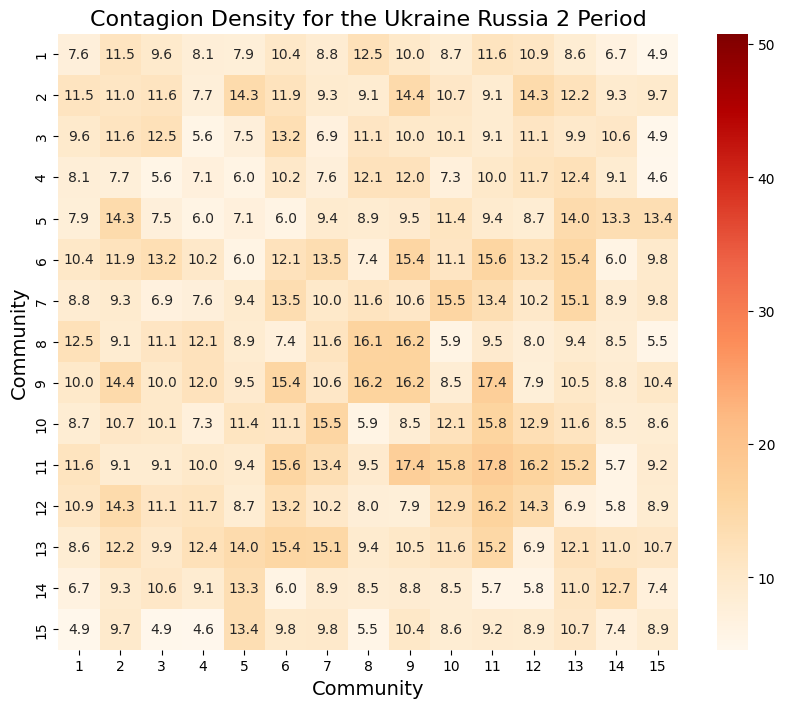

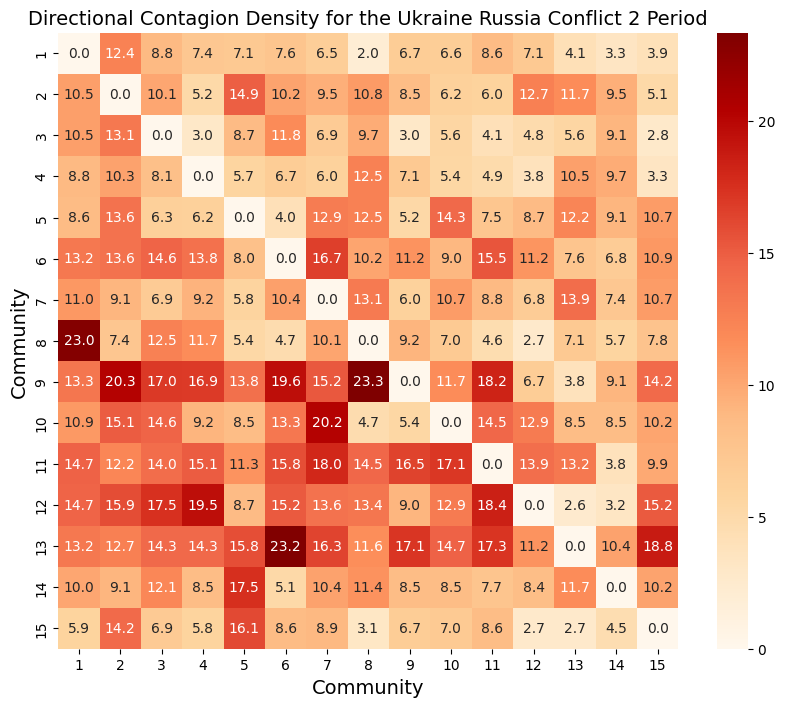

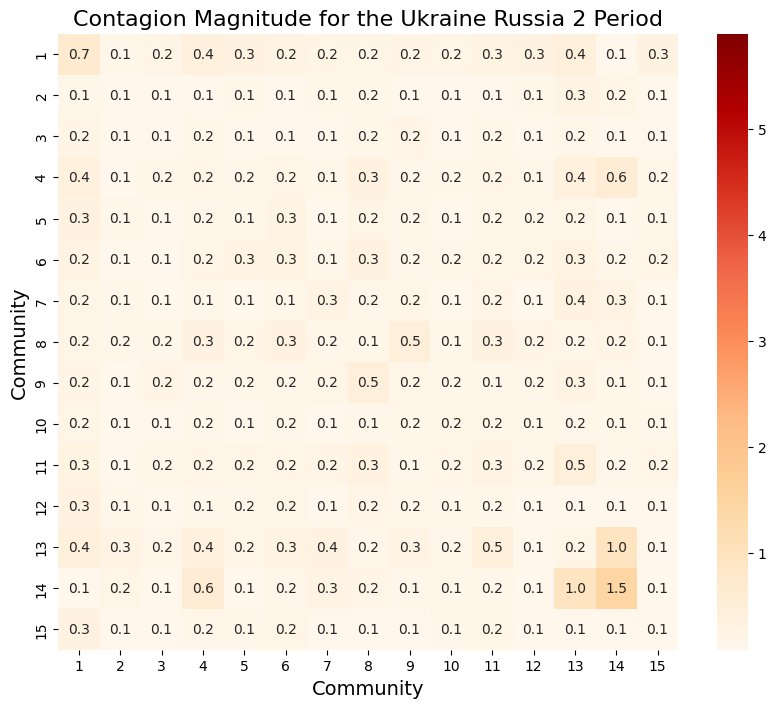

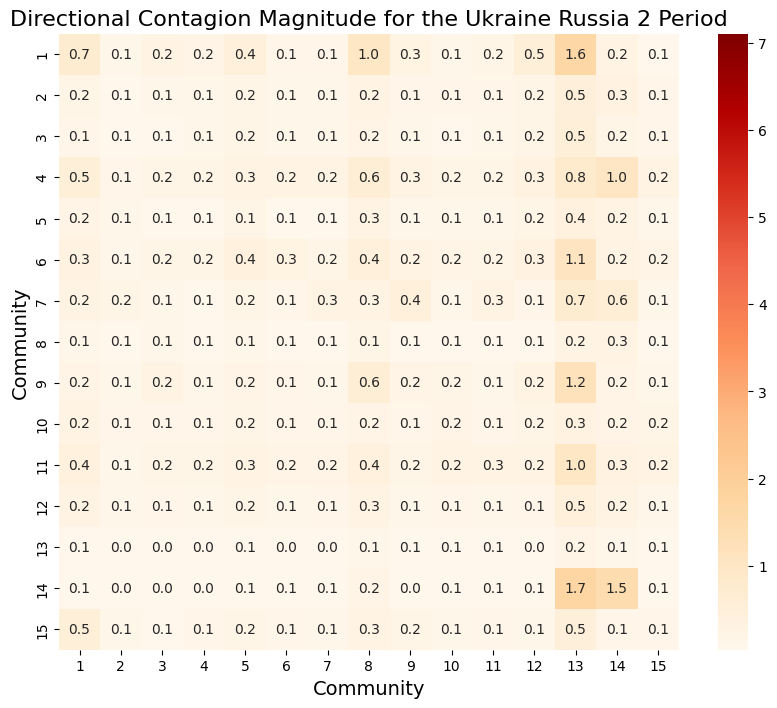

In [13]:
# Read Contagion params
return_ped7 = return_data[11455:]
# contagion_ped7 = Var_model(return_ped7,return_ped7.columns.values, n_lags = 1)
# contagion_ped7.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped7.csv")
contagion_ped7 = pd.read_csv("drive/MyDrive/Project_5/contagion/U R 2/contagion_params_ped7.csv")
contagion_ped7 = contagion_ped7.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection
cm_ped7 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/U_R_2/second_U_R_221_assets_TW.csv")

# declare the model
var_result_ped7 = contagion_metrics_within_community(contagion_ped7)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped7.groupby(by = "group"))
num_community = len(list_community)
labels = [x + 1 for x in range(num_community)]
contagion_density_matrix_ped7 = np.zeros((num_community,num_community))
directional_density_matrix_ped7 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped7.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped7[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped7.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped7[com, com2] = density_cross_community
      directional_density_matrix_ped7[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped7.npy",contagion_density_matrix_ped7)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped7.npy",directional_density_matrix_ped7)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped7, cmap = 'OrRd', xticklabels= labels , yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt=".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Ukraine Russia 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped7.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped7, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt=".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Ukraine Russia Conflict 2 Period" ,fontsize = 14)
plt.savefig("heatmap_directional_contagion_density_ped7.png", bbox_inches='tight',pad_inches = 0.1)



# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped7 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped7 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped7.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped7[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped7[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped7.npy",contagion_magnitude_matrix_ped7)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped7.npy",contagion_magnitude_transmitter_matrix_ped7)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped7, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Ukraine Russia 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped7.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped7, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Ukraine Russia 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped7.png", bbox_inches='tight',pad_inches = 0.1)


# Find the max value for each metric
# contagion_density_values.append(contagion_density_matrix_ped7.max())
# directional_density_values.append(directional_density_matrix_ped7.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped7.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped7.max())




## U-R 1

Text(0.5, 1.0, 'Directional Contagion Magnitude for the Ukraine Russia 1 Period')

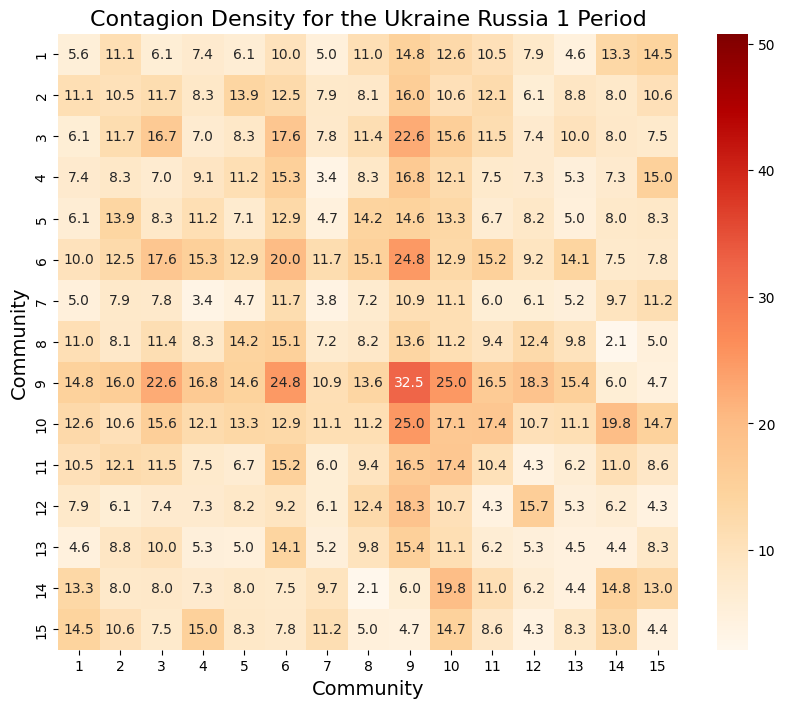

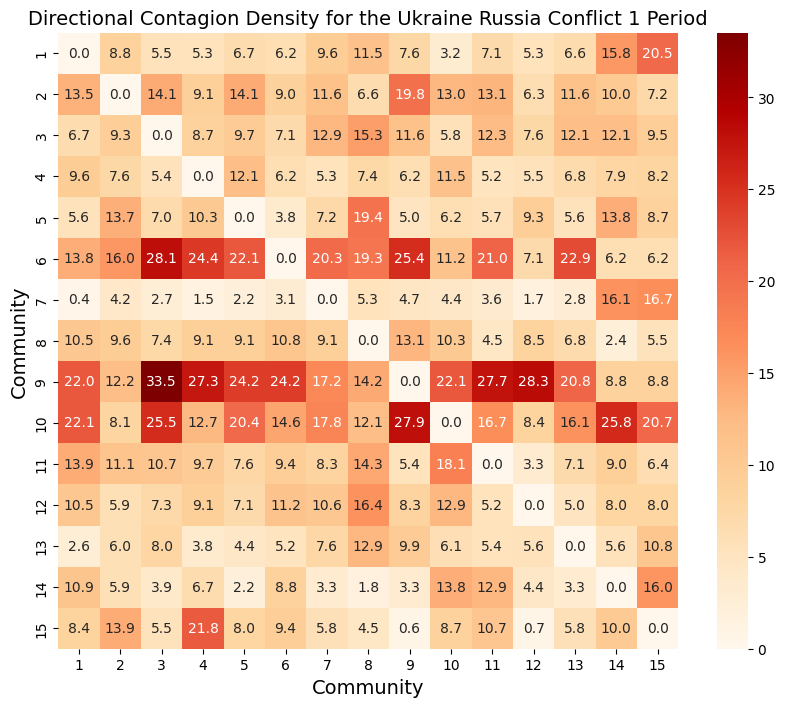

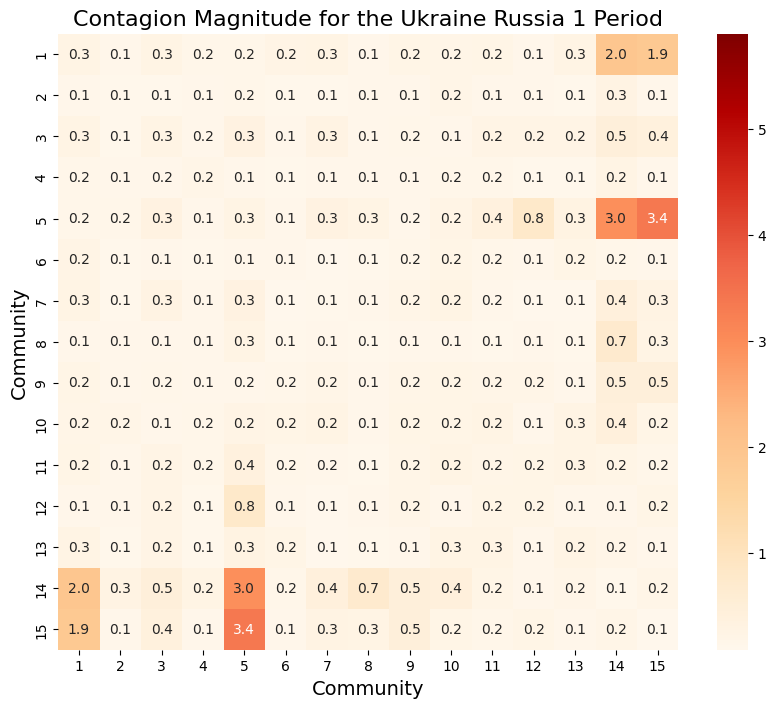

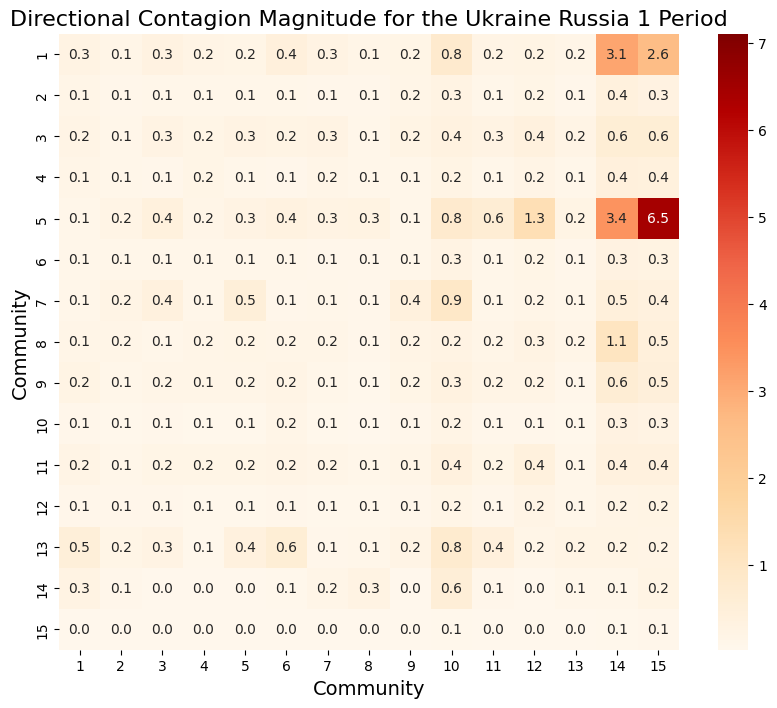

In [14]:
# Read Contagion params
return_ped6 = return_data[9479:11455]
# contagion_ped6 = Var_model(return_ped6,return_ped6.columns.values, n_lags = 1)
# contagion_ped6.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped6.csv")
contagion_ped6 = pd.read_csv("drive/MyDrive/Project_5/contagion/U R 1/contagion_params_ped6.csv")
contagion_ped6 = contagion_ped6.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection
cm_ped6 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/U_R_1/first_U_R_221_assets_TW.csv")

# declare the model
var_result_ped6 = contagion_metrics_within_community(contagion_ped6)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped6.groupby(by = "group"))
num_community = len(list_community)
labels = [x+1 for x in range(num_community)]
contagion_density_matrix_ped6 = np.zeros((num_community,num_community))
directional_density_matrix_ped6 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped6.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped6[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped6.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped6[com, com2] = density_cross_community
      directional_density_matrix_ped6[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped6.npy",contagion_density_matrix_ped6)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped6.npy",directional_density_matrix_ped6)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped6, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Ukraine Russia 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped6.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped6, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Ukraine Russia Conflict 1 Period" ,fontsize = 14)
plt.savefig("heatmap_directional_contagion_density_ped6.png", bbox_inches='tight',pad_inches = 0.1)



# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped6 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped6 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped6.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped6[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped6[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped6.npy",contagion_magnitude_matrix_ped6)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped6.npy",contagion_magnitude_transmitter_matrix_ped6)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped6, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Ukraine Russia 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped6, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Ukraine Russia 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped6.png", bbox_inches='tight',pad_inches = 0.1)



# Find the max value of each metric
# contagion_density_values.append(contagion_density_matrix_ped6.max())
# directional_density_values.append(directional_density_matrix_ped6.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped6.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped6.max())



## Bull Time 3

Text(0.5, 1.0, 'Directional Contagion Magnitude for the Bull Time 3 Period')

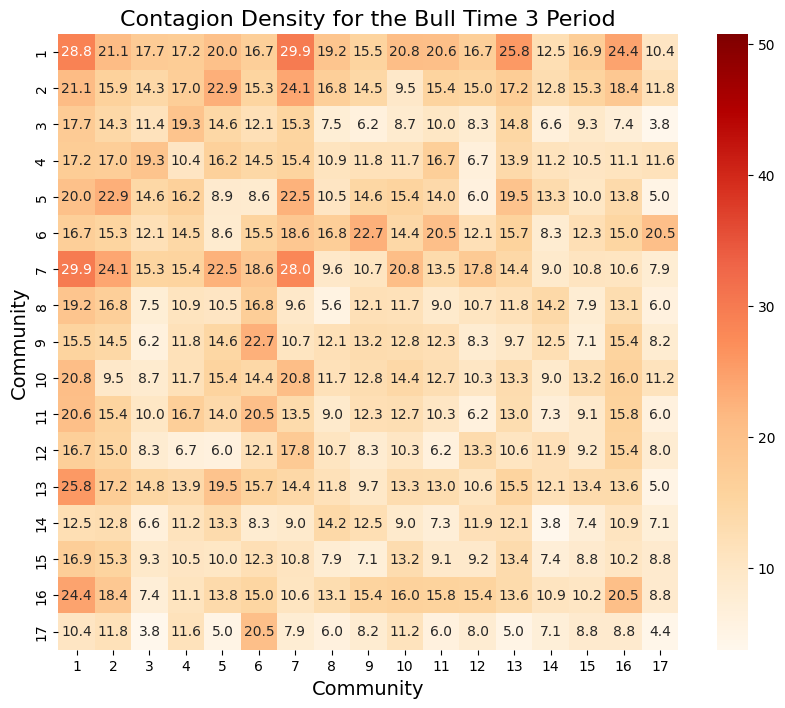

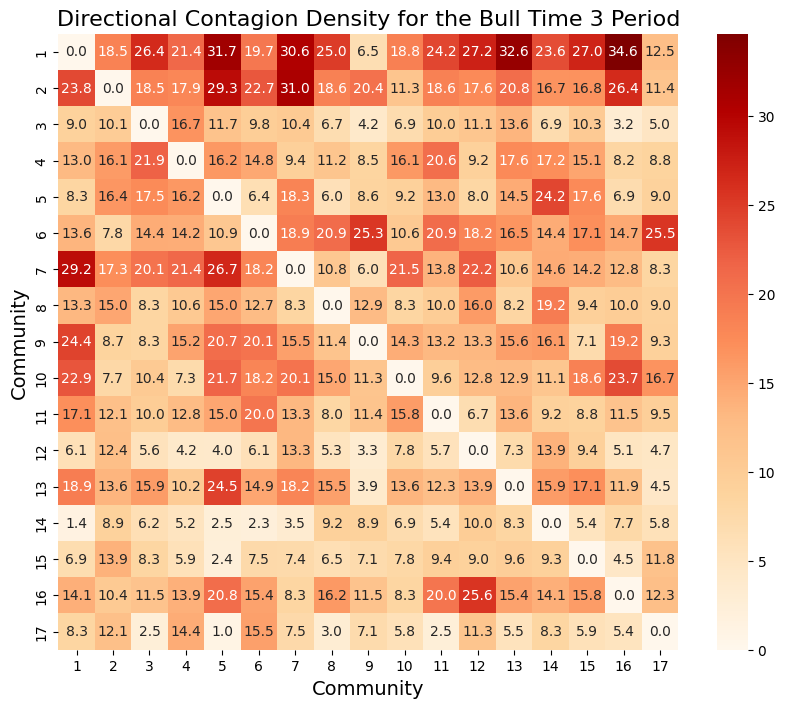

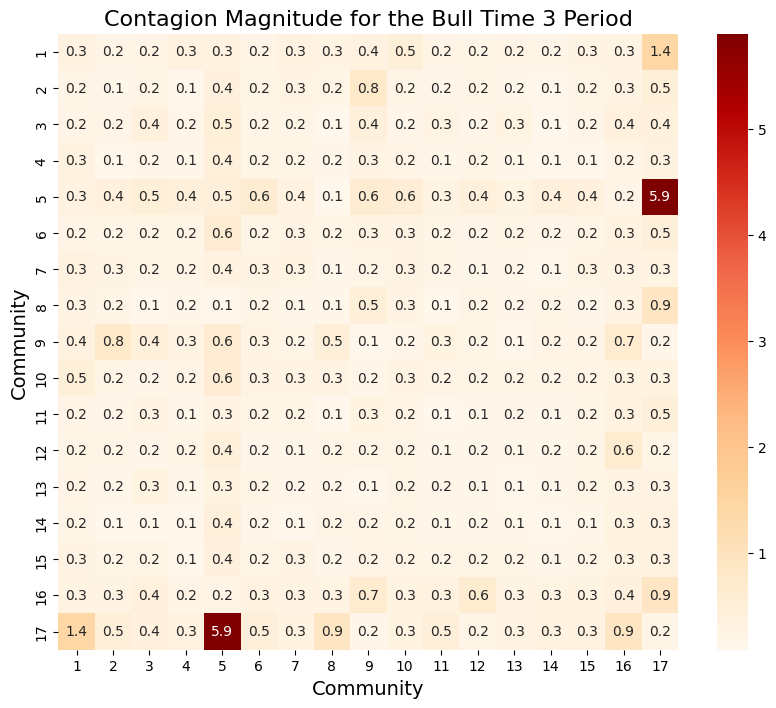

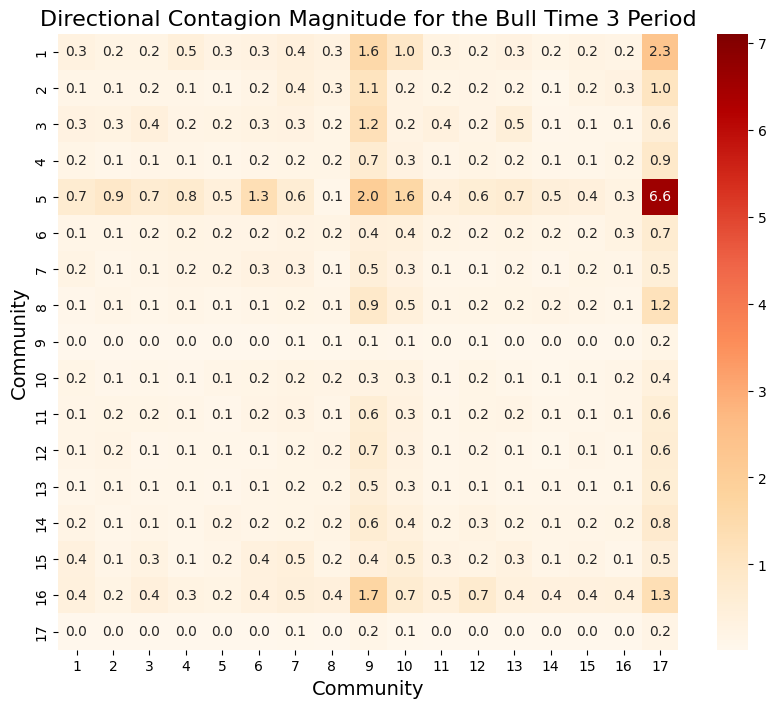

In [15]:
# Read Contagion params
return_ped5 = return_data[7912:9479]
# contagion_ped5 = Var_model(return_ped5,return_ped5.columns.values, n_lags = 1)
# contagion_ped5.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped5.csv")
contagion_ped5 = pd.read_csv("drive/MyDrive/Project_5/contagion/Bull Time 3/contagion_params_ped5.csv")
contagion_ped5 = contagion_ped5.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection
cm_ped5 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/Bull_Time_3/third_Bull_221_assets_TW.csv")

# declare the model
var_result_ped5 = contagion_metrics_within_community(contagion_ped5)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped5.groupby(by = "group"))
num_community = len(list_community)
labels = [x  + 1 for x in range(num_community)]
contagion_density_matrix_ped5 = np.zeros((num_community,num_community))
directional_density_matrix_ped5 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped5.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped5[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped5.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped5[com, com2] = density_cross_community
      directional_density_matrix_ped5[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped5.npy",contagion_density_matrix_ped5)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped5.npy",directional_density_matrix_ped5)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped5, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Bull Time 3 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped5.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped5, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Bull Time 3 Period" ,fontsize = 16)
plt.savefig("heatmap_directional_contagion_density_ped5.png", bbox_inches='tight',pad_inches = 0.1)



# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped5 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped5 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped5.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped5[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped5[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped5.npy",contagion_magnitude_matrix_ped5)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped5.npy",contagion_magnitude_transmitter_matrix_ped5)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped5, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Bull Time 3 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped5.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped5, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Bull Time 3 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped5.png", bbox_inches='tight',pad_inches = 0.1)


# Find the max value for each metric
# contagion_density_values.append(contagion_density_matrix_ped5.max())
# directional_density_values.append(directional_density_matrix_ped5.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped5.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped5.max())




## Bull Time 2

Text(0.5, 1.0, 'Directional Contagion Magnitude for the Bull Time 2 Period')

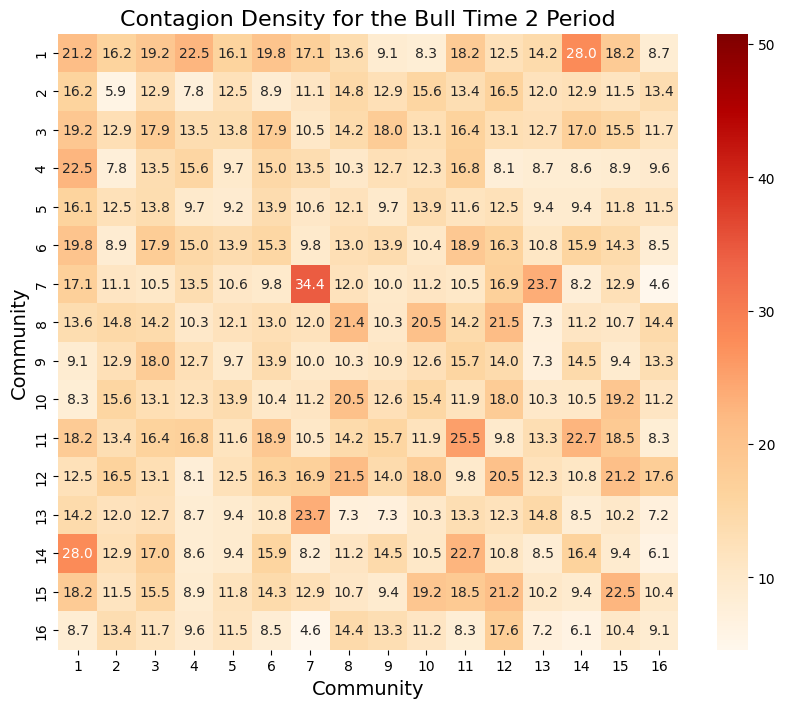

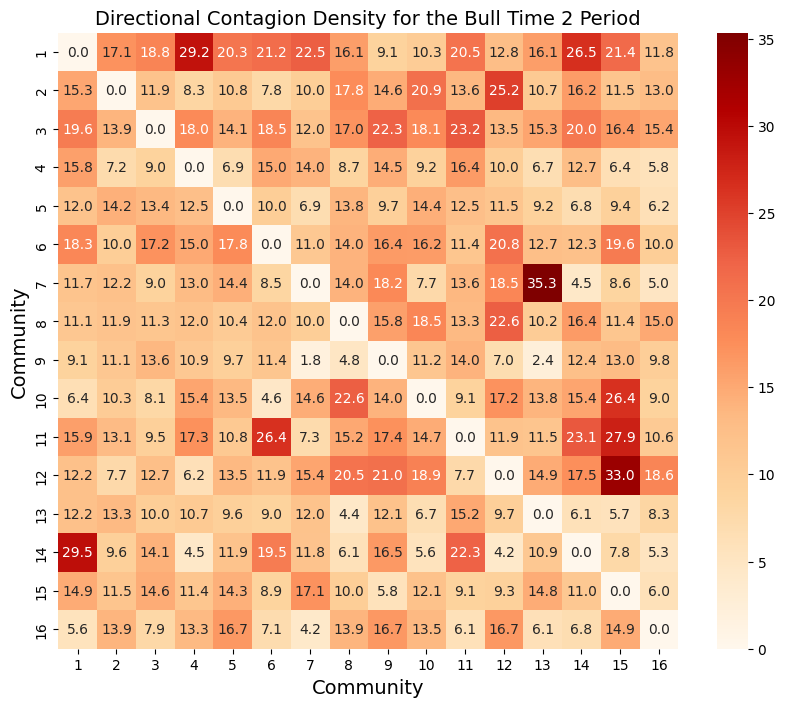

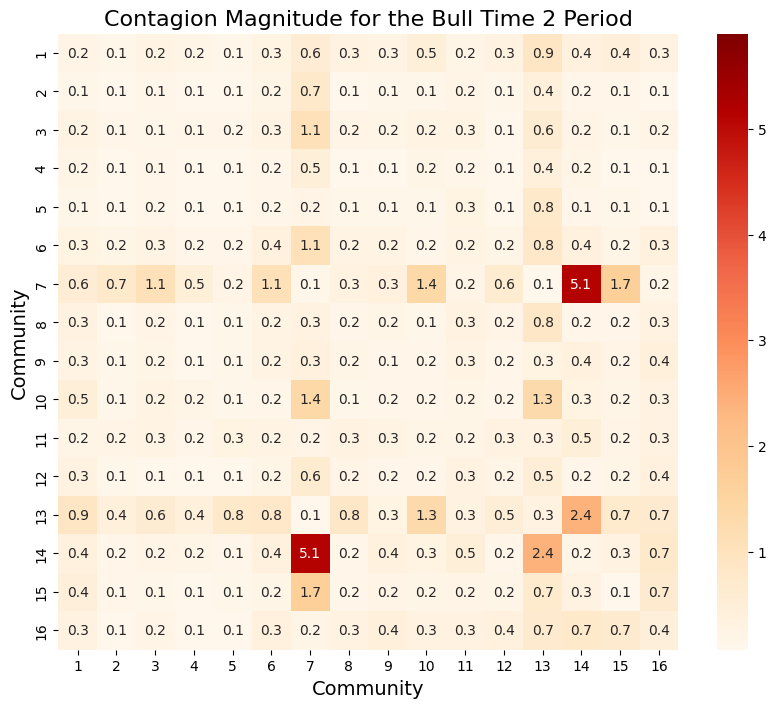

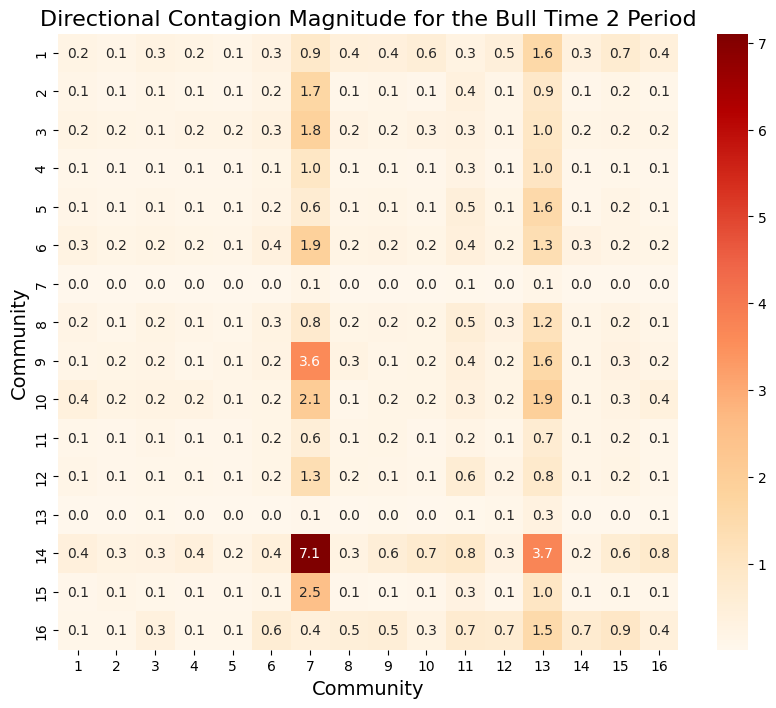

In [16]:
# Read Contagion params
return_ped4 = return_data[5988:7912]
# contagion_ped4 = Var_model(return_ped4,return_ped4.columns.values, n_lags = 1)
# contagion_ped4.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped4.csv")
contagion_ped4 = pd.read_csv("drive/MyDrive/Project_5/contagion/Bull Time 2/contagion_params_ped4.csv")
contagion_ped4 = contagion_ped4.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection
cm_ped4 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/Bull_Time_2/second_Bull_221_assets_TW.csv")

# declare the model
var_result_ped4 = contagion_metrics_within_community(contagion_ped4)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped4.groupby(by = "group"))
num_community = len(list_community)
labels = [x + 1 for x in range(num_community)]
contagion_density_matrix_ped4 = np.zeros((num_community,num_community))
directional_density_matrix_ped4 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped4.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped4[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped4.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped4[com, com2] = density_cross_community
      directional_density_matrix_ped4[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped4.npy",contagion_density_matrix_ped4)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped4.npy",directional_density_matrix_ped4)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped4, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Bull Time 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped4.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped4, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt = ".1f" )
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Bull Time 2 Period" ,fontsize = 14)
plt.savefig("heatmap_directional_contagion_density_ped4.png", bbox_inches='tight',pad_inches = 0.1)



# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped4 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped4 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped4.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped4[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped4[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped4.npy",contagion_magnitude_matrix_ped4)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped4.npy",contagion_magnitude_transmitter_matrix_ped4)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped4, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Bull Time 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped4.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped4, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Bull Time 2 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped4.png", bbox_inches='tight',pad_inches = 0.1)


# Find the max value for each metric

# contagion_density_values.append(contagion_density_matrix_ped4.max())
# directional_density_values.append(directional_density_matrix_ped4.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped4.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped4.max())






## Bull-Time 1

Text(0.5, 1.0, 'Directional Contagion Magnitude for the Bull Time 1 Period')

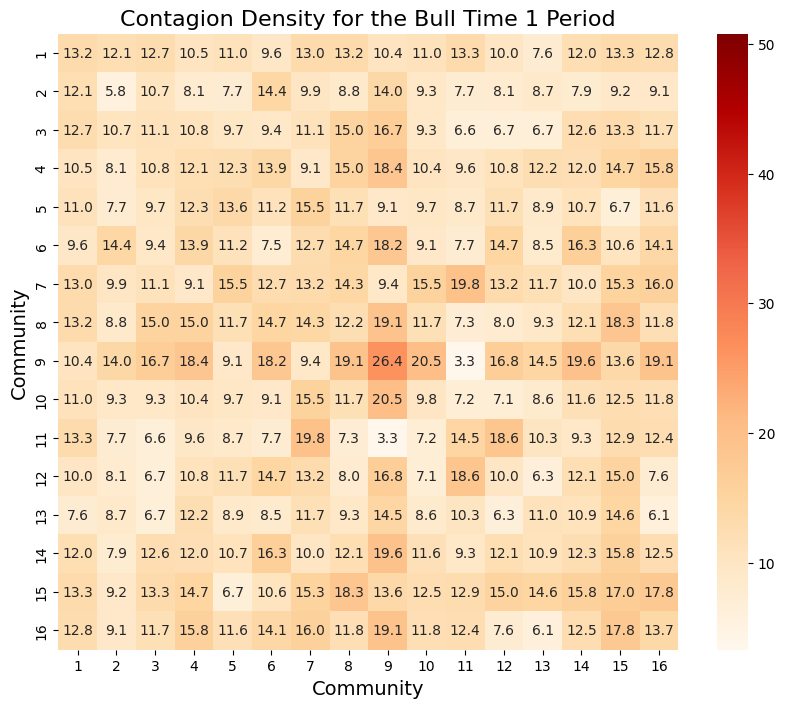

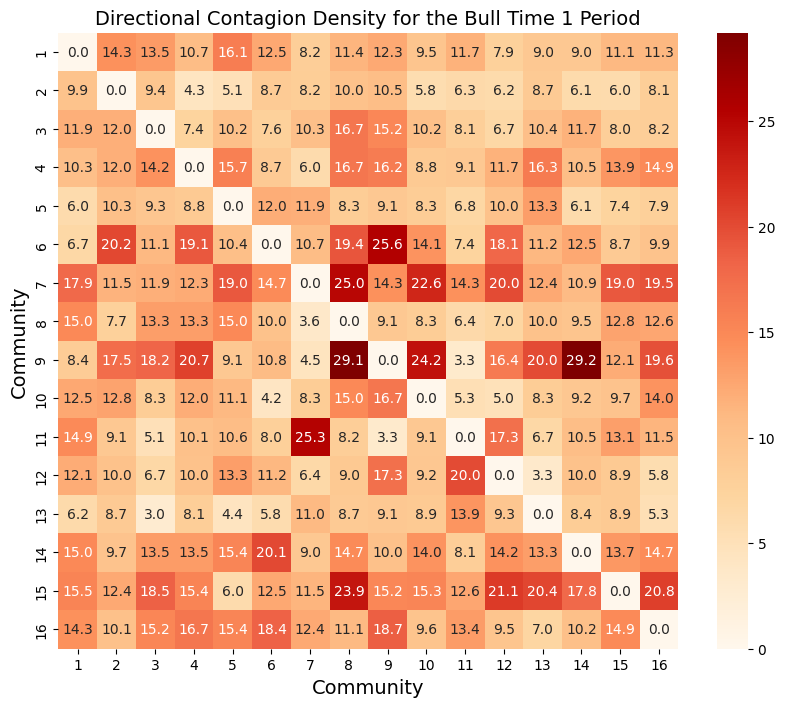

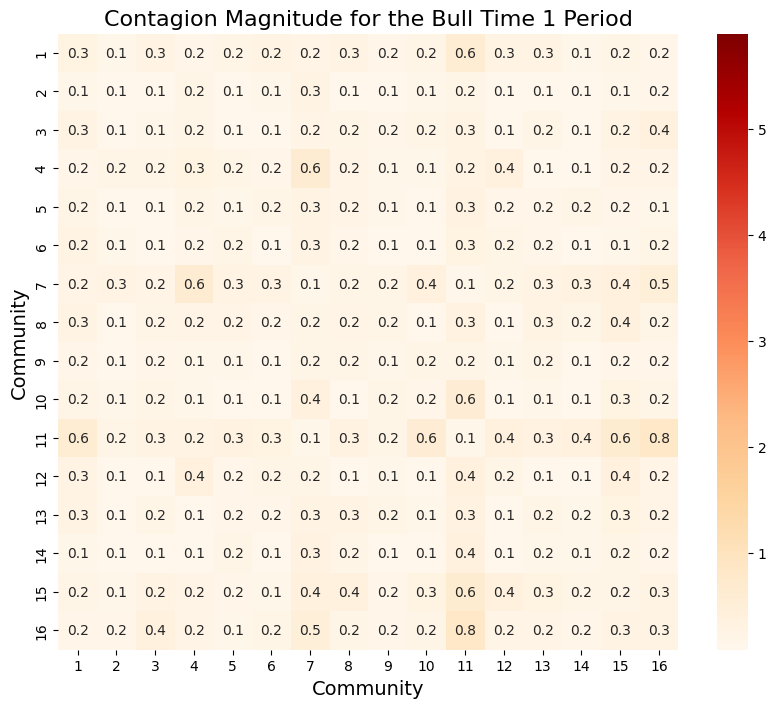

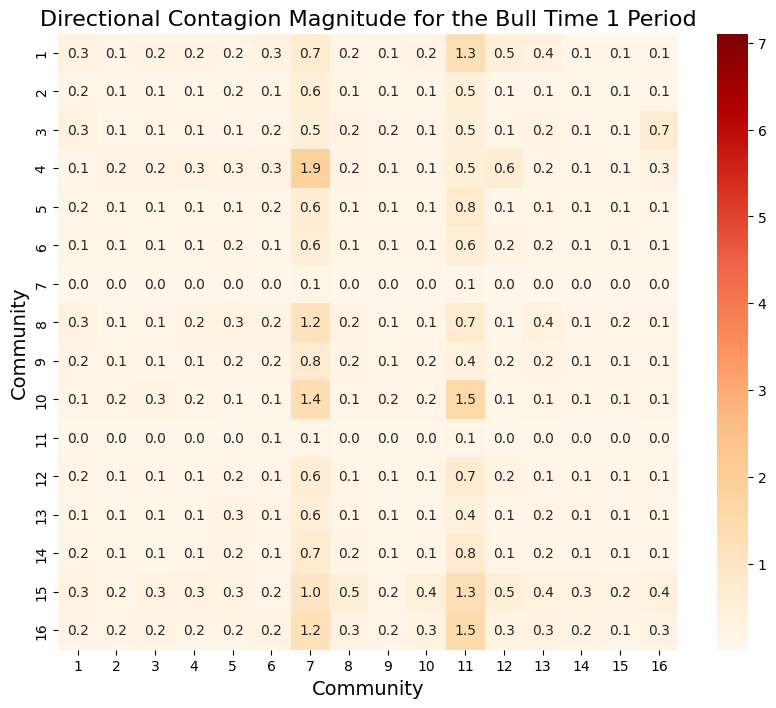

In [17]:
# Read Contagion params
return_ped3 = return_data[4089:5988]
# contagion_ped3 = Var_model(return_ped3,return_ped3.columns.values, n_lags = 1)
# contagion_ped3.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped3.csv")
contagion_ped3 = pd.read_csv("drive/MyDrive/Project_5/contagion/Bull Time 1/contagion_params_ped3.csv")
contagion_ped3 = contagion_ped3.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection
cm_ped3 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/Bull_Time_1/first_Bull_221_assets_TW.csv")

# declare the model
var_result_ped3 = contagion_metrics_within_community(contagion_ped3)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped3.groupby(by = "group"))
num_community = len(list_community)
labels = [x +1 for x in range(num_community)]
contagion_density_matrix_ped3 = np.zeros((num_community,num_community))
directional_density_matrix_ped3 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped3.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped3[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped3.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped3[com, com2] = density_cross_community
      directional_density_matrix_ped3[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped3.npy",contagion_density_matrix_ped3)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped3.npy",directional_density_matrix_ped3)



# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped3 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped3 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped3.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped3[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped3[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped3.npy",contagion_magnitude_matrix_ped3)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped3.npy",contagion_magnitude_transmitter_matrix_ped3)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped3, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Bull Time 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped3.png", bbox_inches='tight',pad_inches = 0.1)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped3, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt = ".1f" )
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Bull Time 1 Period" ,fontsize = 14)
plt.savefig("heatmap_directional_contagion_density_ped3.png", bbox_inches='tight',pad_inches = 0.1)




# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped3 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped3 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped3.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped3[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped3[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped3.npy",contagion_magnitude_matrix_ped3)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped3.npy",contagion_magnitude_transmitter_matrix_ped3)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped3, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Bull Time 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped3.png", bbox_inches='tight',pad_inches = 0.1)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped3, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Bull Time 1 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped3.png", bbox_inches='tight',pad_inches = 0.1)


# Find the max value for each metric
# contagion_density_values.append(contagion_density_matrix_ped3.max())
# directional_density_values.append(directional_density_matrix_ped3.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped3.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped3.max())

In [ ]:
directional_magnitude_values

[np.float64(1.7039371162687695),
 np.float64(6.454015346988365),
 np.float64(6.551825138953483),
 np.float64(7.104936550002858),
 np.float64(1.8670553151083662)]

## Covid-19 Period

In [ ]:
return_data[2464:4089]

,AAPL,ABBV,ABB,ABT,ACN,ADBE,ADI,ADP,AIR,ALV,...,ROBT,RPG,RPV,SLYG,SLYV,SLY,SOXX,SPY,SVXY,XTN
date,,,,,,,,,,,,,,,,,,,,,
2020-01-02 09:30:00,0.015558,0.002258,0.011015,-0.006701,0.003107,0.010858,0.007547,0.004021,0.012804,0.012127,...,0.008112,0.007488,0.002162,0.000466,-0.000497,-0.001104,0.015373,0.006132,0.010967,0.006029
2020-01-02 10:00:00,-0.001445,0.003714,-0.001922,-0.001334,-0.003297,-0.003546,-0.005781,-0.003611,-0.009255,-0.004106,...,-0.002116,-0.003396,-0.005206,-0.005437,-0.006530,-0.004309,-0.004237,-0.002628,-0.002123,-0.004430
2020-01-02 10:30:00,0.001914,0.002680,0.002056,-0.000639,-0.002212,0.001940,0.000672,-0.004348,-0.000886,0.003051,...,0.001250,0.001357,0.002901,0.002644,0.003061,0.001823,0.000250,0.000712,0.003334,0.002153
2020-01-02 11:00:00,0.000000,0.001914,-0.000410,0.000117,-0.000048,-0.000496,0.000630,-0.000206,-0.001552,-0.002815,...,-0.000038,-0.000152,-0.002167,-0.001243,-0.002677,-0.002216,-0.000056,-0.000247,-0.000151,-0.002642
2020-01-02 11:30:00,0.001006,-0.003360,-0.002467,-0.001163,-0.000976,0.001262,0.002430,-0.000649,-0.002778,0.003050,...,-0.001803,-0.000720,0.000000,-0.001766,-0.000539,-0.000833,0.001146,-0.000371,0.002116,0.000333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-30 13:30:00,-0.000331,-0.000565,-0.000301,0.002047,-0.001305,-0.000626,0.001189,-0.002054,0.005380,0.000312,...,0.000140,0.000622,0.001923,0.001149,0.000409,0.001618,0.000854,0.000261,0.002994,0.000000
2020-06-30 14:00:00,-0.001227,0.002769,0.001780,0.004599,-0.000093,0.001390,0.001843,-0.001428,0.008742,0.001323,...,-0.001399,0.001244,0.002739,0.001766,0.001822,0.000649,0.001667,0.001760,0.003725,-0.000981
2020-06-30 14:30:00,0.002548,-0.000819,0.000000,-0.000572,0.003261,0.002347,-0.000327,0.001083,-0.003391,0.000700,...,0.000000,0.001551,0.000550,0.001077,0.001653,0.002325,0.000333,0.001156,0.001593,0.000888


Text(0.5, 1.0, 'Directional Contagion Magnitude for the Covid-19 Period')

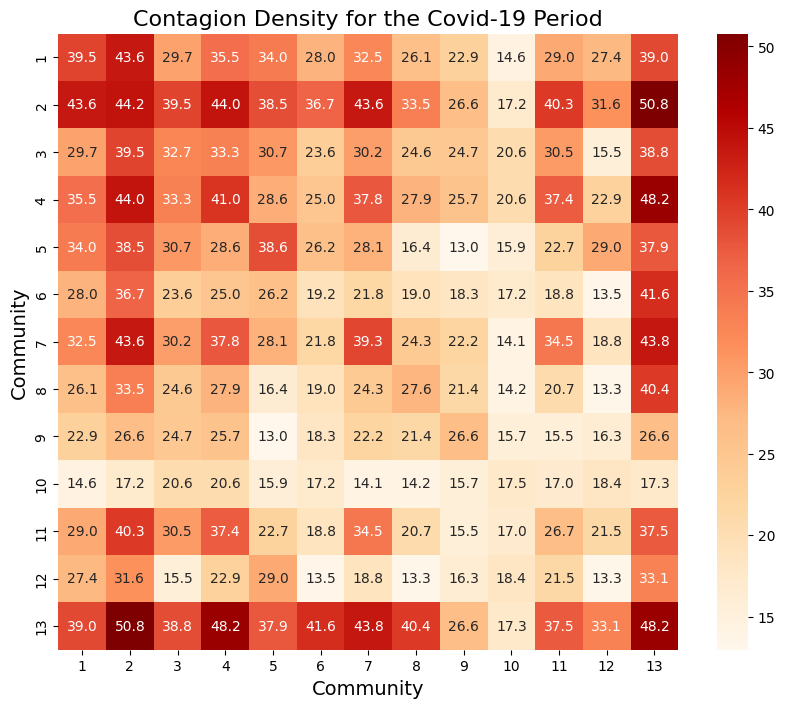

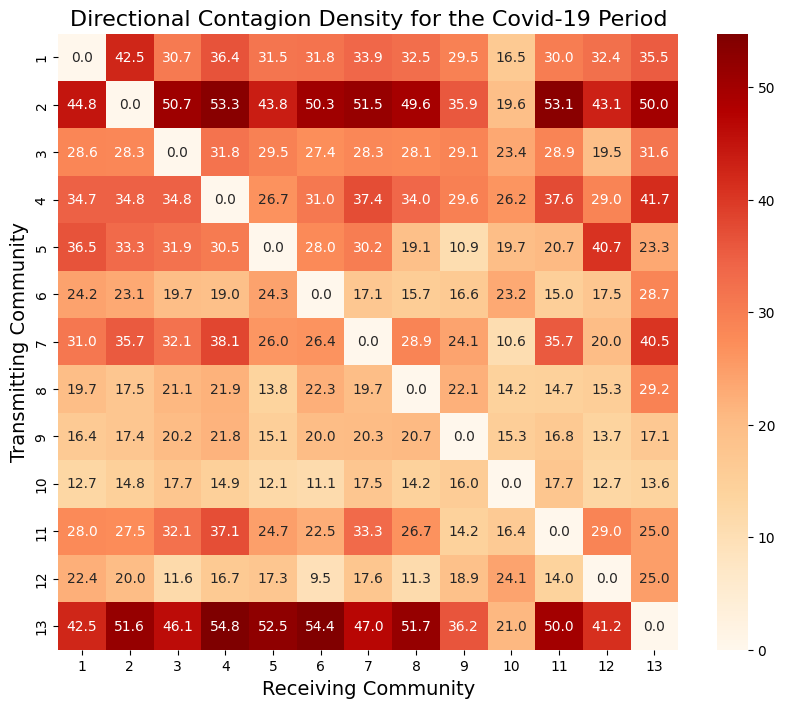

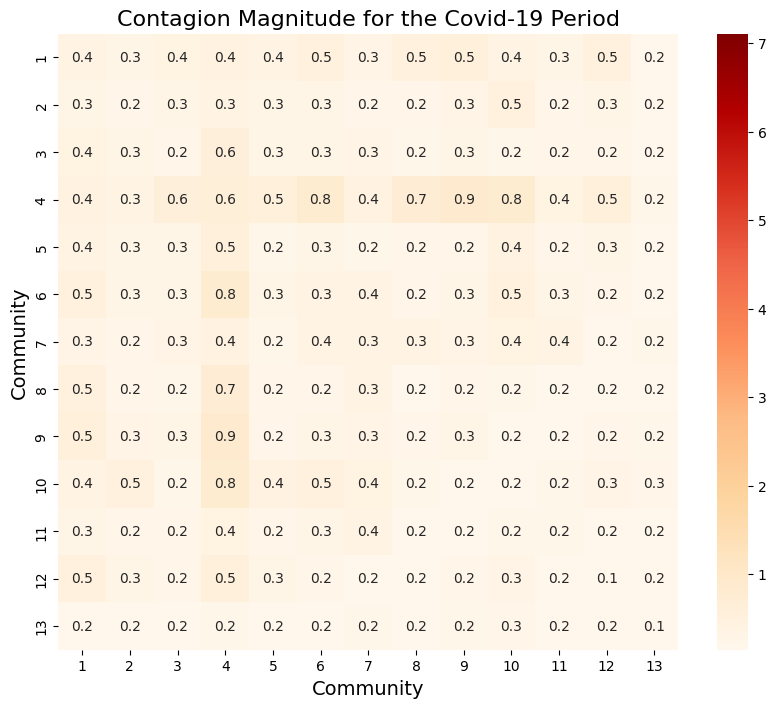

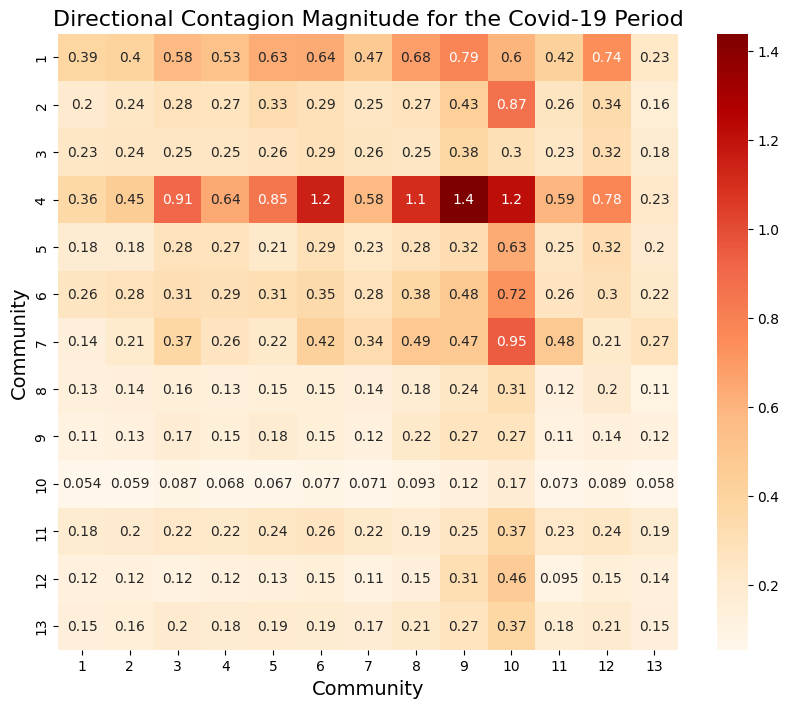

In [18]:
# Read Contagion params
return_ped2 = return_data[2464:4089]
# contagion_ped2 = Var_model(return_ped2,return_ped2.columns.values, n_lags = 1)
# contagion_ped2.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped2.csv")
contagion_ped2 = pd.read_csv("drive/MyDrive/Project_5/contagion/Covid/contagion_params_ped2.csv")
contagion_ped2 = contagion_ped2.rename(columns = {"Unnamed: 0": "index"}).set_index("index")


# read Community Detection
cm_ped2 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/Covid/Covid_221_assets_TW.csv")

# declare the model
var_result_ped2 = contagion_metrics_within_community(contagion_ped2)


# Calculate contagion density within each community and between communities
list_community = list(cm_ped2.groupby(by = "group"))
num_community = len(list_community)
labels = [x +1 for x in range(num_community)]
contagion_density_matrix_ped2 = np.zeros((num_community,num_community))
directional_density_matrix_ped2 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped2.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped2[com,com] = density_per_community


for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped2.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped2[com, com2] = density_cross_community
      directional_density_matrix_ped2[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped2.npy",contagion_density_matrix_ped2)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped2.npy",directional_density_matrix_ped2)
# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped2, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Covid-19 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped2.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped2, cmap = 'OrRd', xticklabels = labels, yticklabels = labels, annot = True, ax = ax, fmt = ".1f")
plt.xlabel("Receiving Community", fontsize = 14)
plt.ylabel("Transmitting Community",fontsize = 14)
plt.title("Directional Contagion Density for the Covid-19 Period" ,fontsize = 16)
plt.savefig("heatmap_directional_contagion_density_ped2.png", bbox_inches='tight',pad_inches = 0.1)

# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped2 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped2 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped2.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped2[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped2[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped2.npy",contagion_magnitude_matrix_ped2)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped2.npy",contagion_magnitude_transmitter_matrix_ped2)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped2, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Covid-19 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped2.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped2, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax)
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Covid-19 Period" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped2.png", bbox_inches='tight',pad_inches = 0.1)


# Find the max value for each metric
# contagion_density_values.append(contagion_density_matrix_ped2.max())
# directional_density_values.append(directional_density_matrix_ped2.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped2.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped2.max())

## Pre-Covid-19 Period

In [19]:
# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped2 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped2 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped2.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped2[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped2[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver


Text(0.5, 1.0, 'Directional Contagion Magnitude for the Pre-Covid-19')

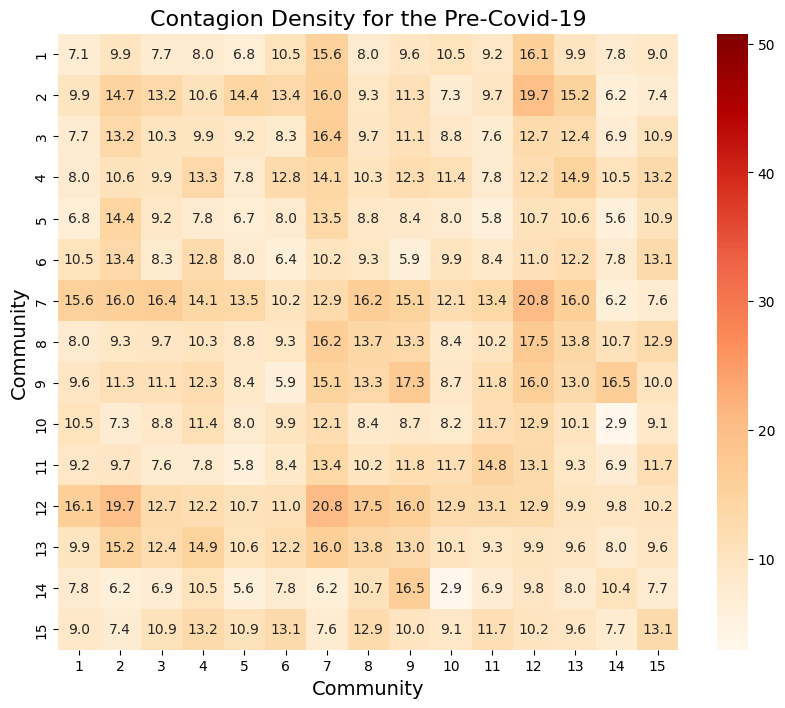

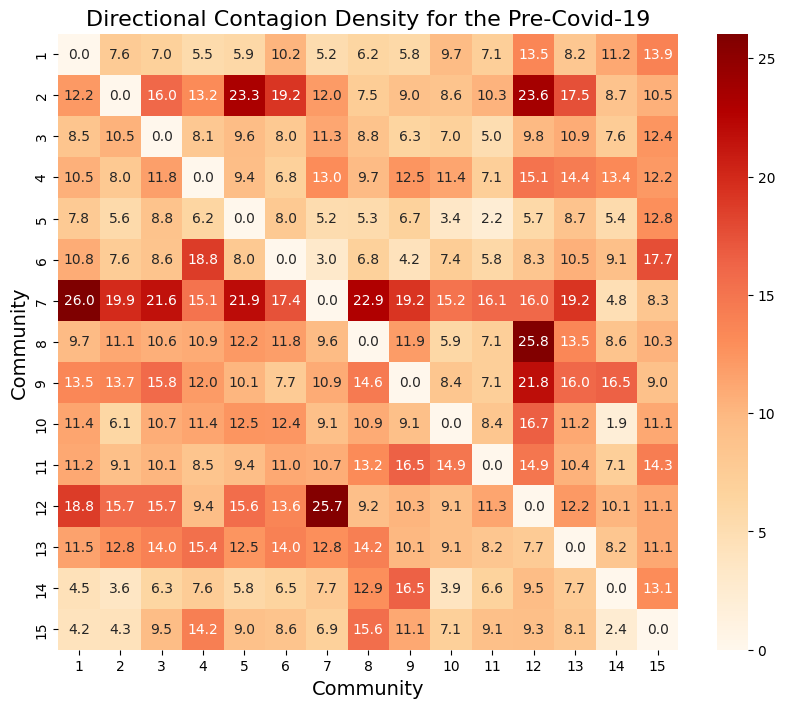

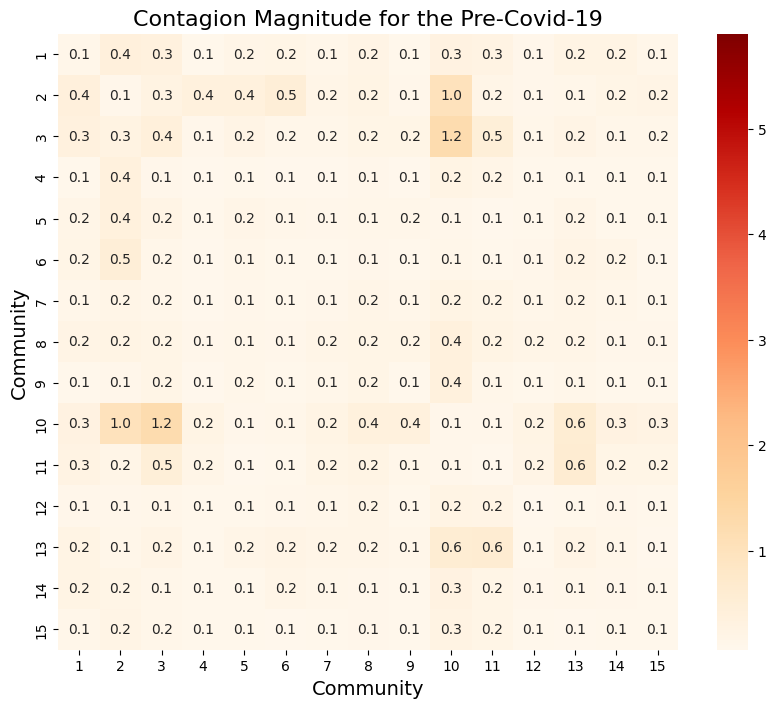

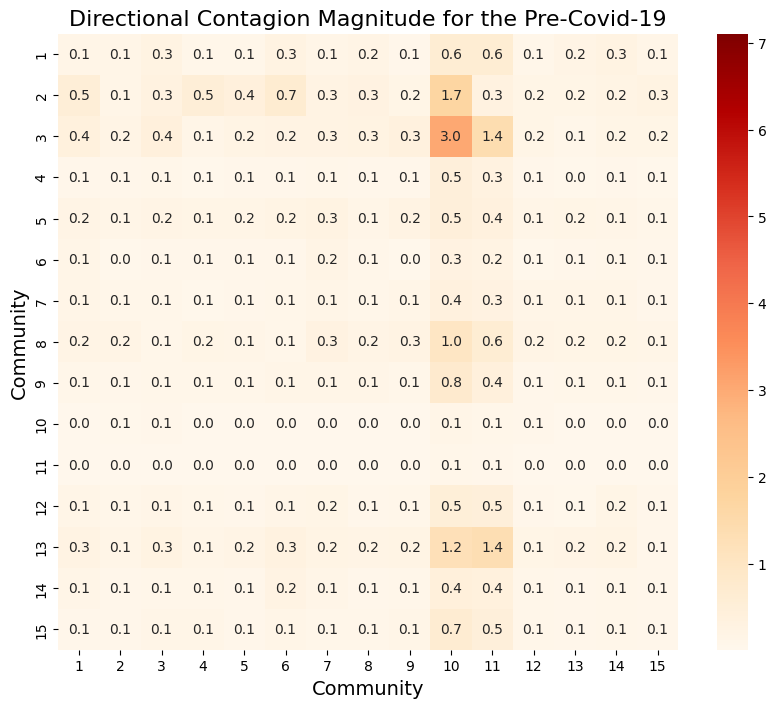

In [20]:
return_ped1 = return_data[:2464]
# contagion_ped1 = Var_model(return_ped1,return_ped1.columns.values, n_lags = 1)
# contagion_ped1.to_csv("drive/MyDrive/Project_5/contagion/contagion_params_ped1.csv")

contagion_ped1 = pd.read_csv("drive/MyDrive/Project_5/contagion/Pre-Covid/contagion_params_ped1.csv")
contagion_ped1 = contagion_ped1.rename(columns = {"Unnamed: 0": "index"}).set_index("index")
# read Community Detection

cm_ped1 = pd.read_csv("drive/MyDrive/Project_5/Community_detection/Pre_Covid/Pre_Covid_221_assets_TW.csv")
# declare the model
var_result_ped1 = contagion_metrics_within_community(contagion_ped1)

list_community = list(cm_ped1.groupby(by = "group"))
num_community = len(list_community)
labels = [x + 1 for x in range(num_community)]
contagion_density_matrix_ped1 = np.zeros((num_community,num_community))
directional_density_matrix_ped1 = np.zeros((num_community,num_community))

for com in range(num_community):
  density_per_community = var_result_ped1.sub_group_contagion_density(list_community[com][1]["asset"].values)
  contagion_density_matrix_ped1[com,com] = density_per_community

for com in range(num_community):
  for com2 in range(num_community):
    if com != com2:
      density_cross_community,directional_density_cross_community,_ = var_result_ped1.cross_contagion_density(list_community[com][1]["asset"].values, list_community[com2][1]["asset"].values)
      contagion_density_matrix_ped1[com, com2] = density_cross_community
      directional_density_matrix_ped1[com, com2] = directional_density_cross_community

# np.save("drive/MyDrive/Project_5/contagion/contagion_density_matrix_ped1.npy",contagion_density_matrix_ped1)
# np.save("drive/MyDrive/Project_5/contagion/contagion_directional_density_matrix_ped1.npy",directional_density_matrix_ped1)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_density_matrix_ped1, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_density_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Density for the Pre-Covid-19" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_density_ped1.png", bbox_inches='tight',pad_inches = 0.1)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(directional_density_matrix_ped1, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax, fmt = ".1f" )
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Density for the Pre-Covid-19" ,fontsize = 16)
plt.savefig("heatmap_directional_contagion_density_ped1.png", bbox_inches='tight',pad_inches = 0.1)

# transmitter to receiver (community to community)
contagion_magnitude_matrix_ped1 = np.zeros((num_community,num_community))
contagion_magnitude_transmitter_matrix_ped1 = np.zeros((num_community,num_community))

for com in range(num_community):
  for com2 in range(num_community):
    magnitude_cross_community, magnitude_com_to_com2,_ = var_result_ped1.cross_contagion_magnitude(list_community[com][1]["asset"].values,list_community[com2][1]["asset"].values )
    contagion_magnitude_matrix_ped1[com, com2] = magnitude_cross_community
    contagion_magnitude_transmitter_matrix_ped1[com,com2] = magnitude_com_to_com2 # row is transmitter, column is receiver

# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_matrix_ped1.npy",contagion_magnitude_matrix_ped1)
# np.save("drive/MyDrive/Project_5/contagion/contagion_magnitude_transmitter_matrix_ped1.npy",contagion_magnitude_transmitter_matrix_ped1)

# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_matrix_ped1, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = contagion_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Contagion Magnitude for the Pre-Covid-19" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_contagion_magnitude_ped1.png", bbox_inches='tight',pad_inches = 0.1)


# Plot the correlation matrix

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(contagion_magnitude_transmitter_matrix_ped1, cmap = 'OrRd', xticklabels= labels, yticklabels= labels, annot = True, ax = ax,
                 vmax = directional_magnitude_max, fmt = ".1f")
plt.xlabel("Community", fontsize = 14)
plt.ylabel("Community",fontsize = 14)
plt.title("Directional Contagion Magnitude for the Pre-Covid-19" ,fontsize = 16)
# plt.savefig("drive/MyDrive/Project_5/contagion/heatmap_directional_contagion_magnitude_ped1.png", bbox_inches='tight',pad_inches = 0.1)



# Find the max value for each metric
# contagion_density_values.append(contagion_density_matrix_ped1.max())
# directional_density_values.append(directional_density_matrix_ped1.max())
# contagion_magnitude_values.append(contagion_magnitude_matrix_ped1.max())
# directional_magnitude_values.append(contagion_magnitude_transmitter_matrix_ped1.max())


For the first RQ, to show that self-contagion is not stronger than cross contagion, using distribution for the cross-contagion and show that selfcontagion is lower or within the distribution.

For the second RQ, Use two metrics like in Physica A paper

Need to match the value threshold of the heatmap first

# **Rsearch Question 1**

+ Constructing the distribution of cross-contagion values
+ Marking the self-cotagion values on the distribution

## Pre-Covid

In [ ]:
contagion_density_matrix_ped1

array([[ 7.08333333,  9.89583333,  7.72058824,  8.0078125 ,  6.8359375 ,
        10.51136364, 15.625     ,  7.96875   ,  9.61538462, 10.51136364,
         9.15178571, 16.14583333,  9.85576923,  7.8125    ,  9.02777778],
       [ 9.89583333, 14.70588235, 13.23529412, 10.59027778, 14.40972222,
        13.38383838, 15.97222222,  9.30555556, 11.32478632,  7.32323232,
         9.72222222, 19.67592593, 15.17094017,  6.15079365,  7.40740741],
       [ 7.72058824, 13.23529412, 10.29411765,  9.92647059,  9.19117647,
         8.28877005, 16.42156863,  9.70588235, 11.08597285,  8.82352941,
         7.56302521, 12.74509804, 12.44343891,  6.93277311, 10.94771242],
       [ 8.0078125 , 10.59027778,  9.92647059, 13.33333333,  7.8125    ,
        12.78409091, 14.0625    , 10.3125    , 12.25961538, 11.36363636,
         7.8125    , 12.23958333, 14.90384615, 10.49107143, 13.19444444],
       [ 6.8359375 , 14.40972222,  9.19117647,  7.8125    ,  6.66666667,
         7.95454545, 13.54166667,  8.75      , 

In [21]:
off_diag_contagion_density1 = np.triu(np.ones_like(contagion_density_matrix_ped1, dtype=bool), k=1)
off_diag_values_contagion_density1 = contagion_density_matrix_ped1[off_diag_contagion_density1]
diagonal_contagion_density1 = np.diag(contagion_density_matrix_ped1)

off_diag_directional_contagion_density1 = ~np.eye(directional_density_matrix_ped1.shape[0], dtype=bool)
off_diag_values_directional_contagion_density1 = directional_density_matrix_ped1[off_diag_directional_contagion_density1]
diagonal_directional_contagion_density1 = np.diag(directional_density_matrix_ped1)

off_diag_contagion_magnitude1 = np.triu(np.ones_like(contagion_magnitude_matrix_ped1, dtype=bool), k=1)
off_diag_values_contagion_magnitude1 = contagion_magnitude_matrix_ped1[off_diag_contagion_magnitude1]
diagonal_contagion_magnitude1 = np.diag(contagion_magnitude_matrix_ped1)

off_diag_directional_contagion_magnitude1 = ~np.eye(contagion_magnitude_transmitter_matrix_ped1.shape[0], dtype=bool)
off_diag_values_directional_contagion_magnitude1 = contagion_magnitude_transmitter_matrix_ped1[off_diag_directional_contagion_magnitude1]
diagonal_directional_contagion_magnitude1 = np.diag(contagion_magnitude_transmitter_matrix_ped1)

In [ ]:
directional_density_matrix_ped1

array([[ 0.        ,  7.63888889,  6.98529412,  5.46875   ,  5.859375  ,
        10.22727273,  5.20833333,  6.25      ,  5.76923077,  9.65909091,
         7.14285714, 13.54166667,  8.17307692, 11.16071429, 13.88888889],
       [12.15277778,  0.        , 16.0130719 , 13.19444444, 23.26388889,
        19.19191919, 12.03703704,  7.5       ,  8.97435897,  8.58585859,
        10.31746032, 23.61111111, 17.52136752,  8.73015873, 10.49382716],
       [ 8.45588235, 10.45751634,  0.        ,  8.08823529,  9.55882353,
         8.02139037, 11.2745098 ,  8.82352941,  6.33484163,  6.95187166,
         5.04201681,  9.80392157, 10.85972851,  7.56302521, 12.41830065],
       [10.546875  ,  7.98611111, 11.76470588,  0.        ,  9.375     ,
         6.81818182, 13.02083333,  9.6875    , 12.5       , 11.36363636,
         7.14285714, 15.10416667, 14.42307692, 13.39285714, 12.15277778],
       [ 7.8125    ,  5.55555556,  8.82352941,  6.25      ,  0.        ,
         7.95454545,  5.20833333,  5.3125    , 

**Distribution of contagion density values**

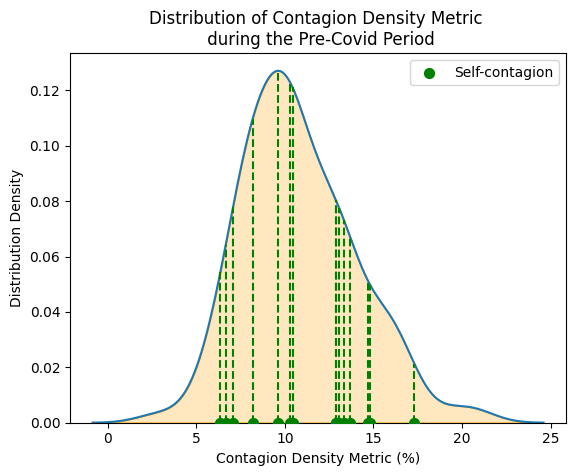

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Pre-Covid Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Pre-Covid/statistical_test/Contagion_density_distribution_Pre_Covid.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


**Percentile for each self-contagion value**

In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 7.083333333333333, equivalent to 0.08571428571428572
Community 2: 14.705882352941178, equivalent to 0.8666666666666667
Community 3: 10.294117647058822, equivalent to 0.5047619047619047
Community 4: 13.333333333333334, equivalent to 0.8095238095238095
Community 5: 6.666666666666667, equivalent to 0.05714285714285715
Community 6: 6.363636363636363, equivalent to 0.05714285714285715
Community 7: 12.878787878787879, equivalent to 0.7428571428571429
Community 8: 13.684210526315791, equivalent to 0.8380952380952381
Community 9: 17.307692307692307, equivalent to 0.9714285714285715
Community 10: 8.181818181818182, equivalent to 0.2285714285714286
Community 11: 14.835164835164836, equivalent to 0.8666666666666667
Community 12: 12.878787878787879, equivalent to 0.7428571428571429
Community 13: 9.615384615384617, equivalent to 0.380952380952381
Community 14: 10.43956043956044, equivalent to 0.5142857142857143
Community 15: 13.071895424836603, equivalent to 0.761904761904762


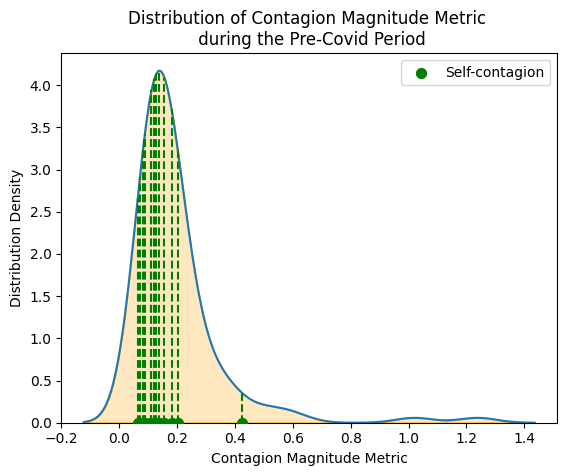

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Pre-Covid Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Pre-Covid/statistical_test/Contagion_magnitude_distribution_Pre_Covid.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)

for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.13747238201317077, equivalent to 0.40952380952380957
Community 2: 0.12188237586865683, equivalent to 0.33333333333333337
Community 3: 0.42517215517050605, equivalent to 0.942857142857143
Community 4: 0.06363986127050127, equivalent to 0.0
Community 5: 0.15588783411221707, equivalent to 0.5523809523809524
Community 6: 0.08677235792126659, equivalent to 0.05714285714285715
Community 7: 0.12144161406325725, equivalent to 0.33333333333333337
Community 8: 0.18052796034830781, equivalent to 0.6476190476190476
Community 9: 0.10775566840960588, equivalent to 0.2285714285714286
Community 10: 0.12775186280278772, equivalent to 0.3523809523809524
Community 11: 0.07121761294290997, equivalent to 0.0
Community 12: 0.08296969191603708, equivalent to 0.0380952380952381
Community 13: 0.20175528877844634, equivalent to 0.7142857142857143
Community 14: 0.11118128025622766, equivalent to 0.2666666666666667
Community 15: 0.08816944751758098, equivalent to 0.05714285714285715


# Covid

In [22]:
off_diag_contagion_density2 = np.triu(np.ones_like(contagion_density_matrix_ped2, dtype=bool), k=1)
off_diag_values_contagion_density2 = contagion_density_matrix_ped2[off_diag_contagion_density2]
diagonal_contagion_density2 = np.diag(contagion_density_matrix_ped2)

off_diag_directional_contagion_density2 = ~np.eye(directional_density_matrix_ped2.shape[0], dtype=bool)
off_diag_values_directional_contagion_density2 = directional_density_matrix_ped2[off_diag_directional_contagion_density2]
diagonal_directional_contagion_density2 = np.diag(directional_density_matrix_ped2)

off_diag_contagion_magnitude2 = np.triu(np.ones_like(contagion_magnitude_matrix_ped2, dtype=bool), k=1)
off_diag_values_contagion_magnitude2 = contagion_magnitude_matrix_ped2[off_diag_contagion_magnitude2]
diagonal_contagion_magnitude2 = np.diag(contagion_magnitude_matrix_ped2)

off_diag_directional_contagion_magnitude2 = ~np.eye(contagion_magnitude_transmitter_matrix_ped2.shape[0], dtype=bool)
off_diag_values_directional_contagion_magnitude2 = contagion_magnitude_transmitter_matrix_ped2[off_diag_directional_contagion_magnitude2]
diagonal_directional_contagion_magnitude2 = np.diag(contagion_magnitude_transmitter_matrix_ped2)

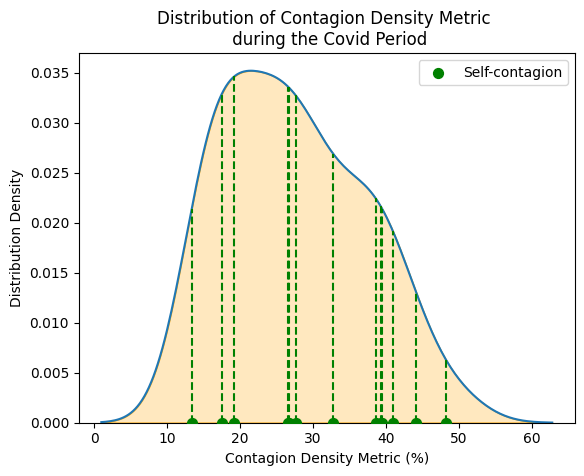

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Covid Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Covid/statistical_test/Contagion_density_distribution_Covid.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 39.5, equivalent to 0.8846153846153847
Community 2: 44.166666666666664, equivalent to 0.9743589743589745
Community 3: 32.748538011695906, equivalent to 0.6923076923076923
Community 4: 40.95238095238095, equivalent to 0.9102564102564104
Community 5: 38.57142857142858, equivalent to 0.8461538461538461
Community 6: 19.210526315789473, equivalent to 0.2692307692307693
Community 7: 39.285714285714285, equivalent to 0.8717948717948718
Community 8: 27.61904761904762, equivalent to 0.5384615384615384
Community 9: 26.608187134502927, equivalent to 0.5
Community 10: 17.532467532467532, equivalent to 0.20512820512820515
Community 11: 26.666666666666668, equivalent to 0.5256410256410257
Community 12: 13.333333333333334, equivalent to 0.02564102564102564
Community 13: 48.214285714285715, equivalent to 0.9871794871794872


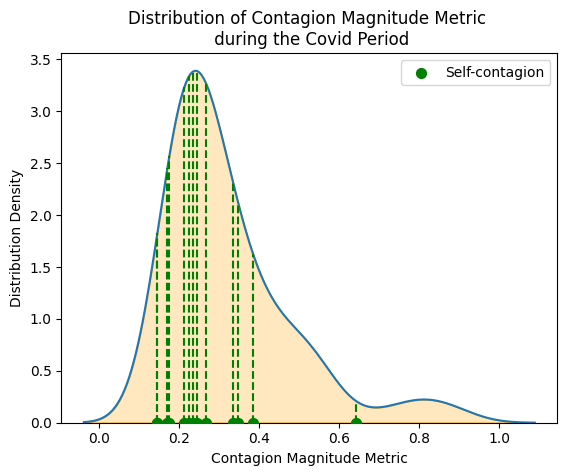

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Covid Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Covid/statistical_test/Contagion_magnitude_distribution_Covid.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)

for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.3858266573819366, equivalent to 0.7435897435897436
Community 2: 0.2350960113404546, equivalent to 0.33333333333333337
Community 3: 0.2451900223471152, equivalent to 0.4102564102564103
Community 4: 0.6417321205051003, equivalent to 0.9487179487179488
Community 5: 0.2138439486381366, equivalent to 0.2307692307692308
Community 6: 0.3477626184188163, equivalent to 0.7051282051282052
Community 7: 0.3356784834115975, equivalent to 0.6794871794871795
Community 8: 0.17633597545137, equivalent to 0.06410256410256411
Community 9: 0.26868022859385254, equivalent to 0.4871794871794872
Community 10: 0.1714664350655775, equivalent to 0.038461538461538464
Community 11: 0.22657173784284432, equivalent to 0.2820512820512821
Community 12: 0.14648766025515944, equivalent to 0.0
Community 13: 0.14508656271323894, equivalent to 0.0


In [ ]:
off_diag_values_contagion_magnitude.max()

np.float64(0.8920250632387884)

# Bull Time 1

In [23]:
off_diag_contagion_density3 = np.triu(np.ones_like(contagion_density_matrix_ped3, dtype=bool), k=1)
off_diag_values_contagion_density3 = contagion_density_matrix_ped3[off_diag_contagion_density3]
diagonal_contagion_density3 = np.diag(contagion_density_matrix_ped3)


off_diag_contagion_magnitude3 = np.triu(np.ones_like(contagion_magnitude_matrix_ped3, dtype=bool), k=1)
off_diag_values_contagion_magnitude3 = contagion_magnitude_matrix_ped3[off_diag_contagion_magnitude3]
diagonal_contagion_magnitude3 = np.diag(contagion_magnitude_matrix_ped3)


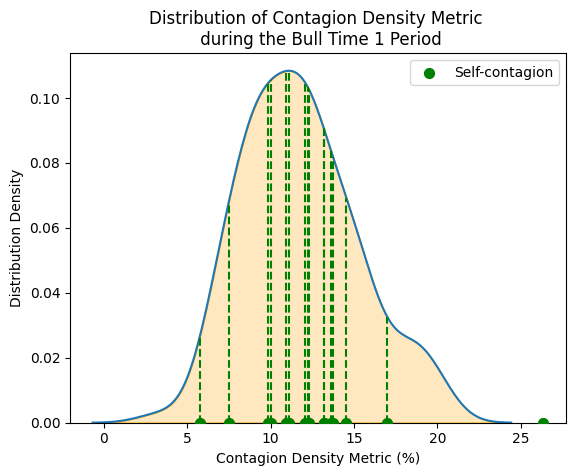

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Bull Time 1 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 1/statistical_test/Contagion_density_distribution_Bull_time_1.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 13.186813186813188, equivalent to 0.6833333333333333
Community 2: 5.769230769230769, equivalent to 0.008333333333333333
Community 3: 11.11111111111111, equivalent to 0.4666666666666667
Community 4: 12.091503267973856, equivalent to 0.575
Community 5: 13.636363636363635, equivalent to 0.7333333333333333
Community 6: 7.5, equivalent to 0.08333333333333333
Community 7: 13.186813186813188, equivalent to 0.6833333333333333
Community 8: 12.222222222222221, equivalent to 0.6
Community 9: 26.36363636363636, equivalent to 1.0
Community 10: 9.848484848484848, equivalent to 0.33333333333333337
Community 11: 14.545454545454545, equivalent to 0.7833333333333333
Community 12: 10.0, equivalent to 0.35833333333333334
Community 13: 10.952380952380953, equivalent to 0.4416666666666667
Community 14: 12.280701754385964, equivalent to 0.6083333333333333
Community 15: 16.99346405228758, equivalent to 0.9166666666666666
Community 16: 13.742690058479532, equivalent to 0.7333333333333333


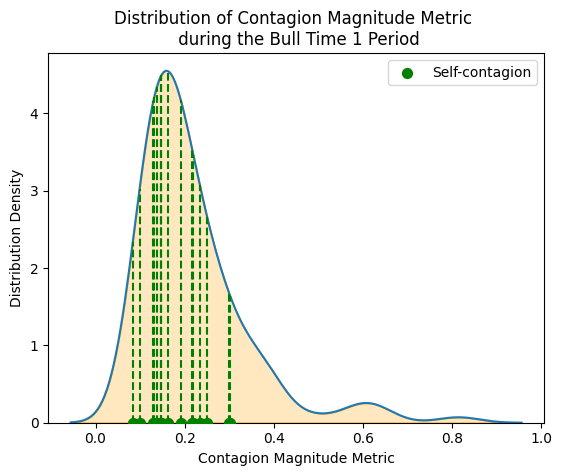

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Bull Time 1 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 1/statistical_test/Contagion_magnitude_distribution_Bull_time_1.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)

for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.299638798427845, equivalent to 0.8333333333333333
Community 2: 0.09860425257904751, equivalent to 0.025
Community 3: 0.14635123128875827, equivalent to 0.30833333333333335
Community 4: 0.30181398597350395, equivalent to 0.8416666666666667
Community 5: 0.13714741355283633, equivalent to 0.25833333333333336
Community 6: 0.08353345329782476, equivalent to 0.0
Community 7: 0.14763580419827155, equivalent to 0.30833333333333335
Community 8: 0.23375664793730763, equivalent to 0.7
Community 9: 0.1314322549704247, equivalent to 0.20833333333333334
Community 10: 0.16330201322001694, equivalent to 0.3666666666666667
Community 11: 0.1478872136862283, equivalent to 0.30833333333333335
Community 12: 0.2194820925200275, equivalent to 0.6416666666666666
Community 13: 0.19128367355647938, equivalent to 0.575
Community 14: 0.12969150584832337, equivalent to 0.19999999999999998
Community 15: 0.2170329131930166, equivalent to 0.6333333333333333
Community 16: 0.2502331924405546, equivalent 

# Bull Time 2

In [24]:
off_diag_contagion_density4 = np.triu(np.ones_like(contagion_density_matrix_ped4, dtype=bool), k=1)
off_diag_values_contagion_density4 = contagion_density_matrix_ped4[off_diag_contagion_density4]
diagonal_contagion_density4 = np.diag(contagion_density_matrix_ped4)


off_diag_contagion_magnitude4 = np.triu(np.ones_like(contagion_magnitude_matrix_ped4, dtype=bool), k=1)
off_diag_values_contagion_magnitude4 = contagion_magnitude_matrix_ped4[off_diag_contagion_magnitude4]
diagonal_contagion_magnitude4 = np.diag(contagion_magnitude_matrix_ped4)


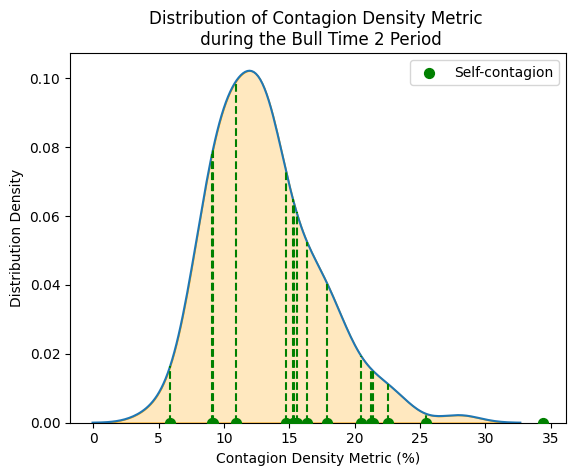

In [ ]:

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Bull Time 2 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 2/statistical_test/Contagion_density_distribution_Bull_time_2.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 21.21212121212121, equivalent to 0.9583333333333333
Community 2: 5.88235294117647, equivalent to 0.008333333333333333
Community 3: 17.894736842105264, equivalent to 0.8666666666666666
Community 4: 15.555555555555555, equivalent to 0.75
Community 5: 9.166666666666666, equivalent to 0.15
Community 6: 15.263157894736842, equivalent to 0.7416666666666666
Community 7: 34.44444444444444, equivalent to 1.0
Community 8: 21.428571428571427, equivalent to 0.9583333333333333
Community 9: 10.909090909090908, equivalent to 0.3416666666666667
Community 10: 15.384615384615385, equivalent to 0.7416666666666666
Community 11: 25.454545454545453, equivalent to 0.9916666666666666
Community 12: 20.51282051282051, equivalent to 0.95
Community 13: 14.761904761904763, equivalent to 0.725
Community 14: 16.363636363636363, equivalent to 0.8083333333333333
Community 15: 22.52747252747253, equivalent to 0.975
Community 16: 9.090909090909092, equivalent to 0.15


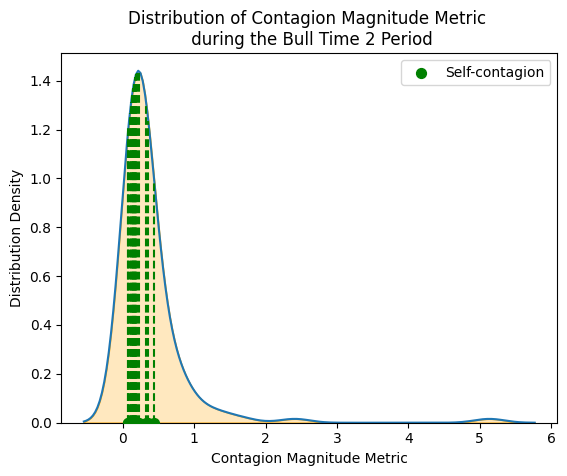

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Bull Time 2 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 2/statistical_test/Contagion_magnitude_distribution_Bull_time_2.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)
for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.2217811769716282, equivalent to 0.48333333333333334
Community 2: 0.07377483403453317, equivalent to 0.0
Community 3: 0.14163338968893752, equivalent to 0.19999999999999998
Community 4: 0.07855641918086173, equivalent to 0.0
Community 5: 0.09953365756419458, equivalent to 0.041666666666666664
Community 6: 0.35697553205017096, equivalent to 0.7416666666666666
Community 7: 0.13292277441130276, equivalent to 0.175
Community 8: 0.16353404171592603, equivalent to 0.3416666666666667
Community 9: 0.14444532652393108, equivalent to 0.21666666666666667
Community 10: 0.15225881599779698, equivalent to 0.25
Community 11: 0.17515350503607524, equivalent to 0.375
Community 12: 0.1896891434403939, equivalent to 0.4083333333333334
Community 13: 0.32973817796115523, equivalent to 0.7083333333333333
Community 14: 0.1964126083038864, equivalent to 0.4166666666666667
Community 15: 0.11617208834996018, equivalent to 0.11666666666666667
Community 16: 0.43903134106711006, equivalent to 0.79999

# Bull Time 3

In [25]:
off_diag_contagion_density5 = np.triu(np.ones_like(contagion_density_matrix_ped5, dtype=bool), k=1)
off_diag_values_contagion_density5 = contagion_density_matrix_ped5[off_diag_contagion_density5]
diagonal_contagion_density5 = np.diag(contagion_density_matrix_ped5)


off_diag_contagion_magnitude5 = np.triu(np.ones_like(contagion_magnitude_matrix_ped5, dtype=bool), k=1)
off_diag_values_contagion_magnitude5 = contagion_magnitude_matrix_ped5[off_diag_contagion_magnitude5]
diagonal_contagion_magnitude5 = np.diag(contagion_magnitude_matrix_ped5)


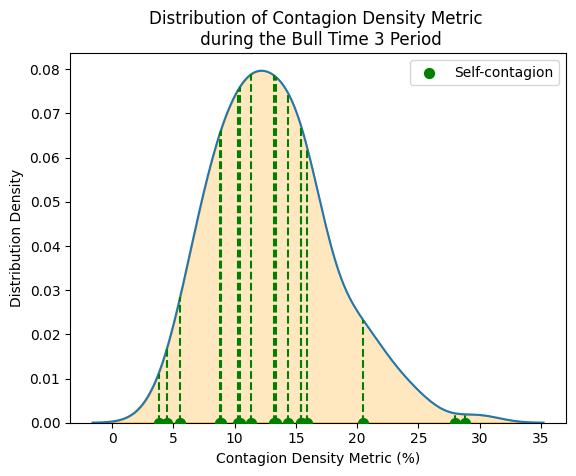

In [ ]:


# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Bull Time 3 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 3/statistical_test/Contagion_density_distribution_Bull_time_3.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 28.78787878787879, equivalent to 0.9926470588235293
Community 2: 15.934065934065933, equivalent to 0.7647058823529411
Community 3: 11.363636363636363, equivalent to 0.3897058823529411
Community 4: 10.416666666666668, equivalent to 0.3014705882352941
Community 5: 8.88888888888889, equivalent to 0.19852941176470587
Community 6: 15.454545454545453, equivalent to 0.7426470588235293
Community 7: 28.030303030303028, equivalent to 0.9926470588235293
Community 8: 5.555555555555555, equivalent to 0.022058823529411763
Community 9: 13.186813186813188, equivalent to 0.5367647058823529
Community 10: 14.393939393939394, equivalent to 0.6323529411764706
Community 11: 10.263157894736842, equivalent to 0.2867647058823529
Community 12: 13.333333333333334, equivalent to 0.5588235294117647
Community 13: 15.454545454545453, equivalent to 0.7426470588235293
Community 14: 3.787878787878788, equivalent to 0.007352941176470588
Community 15: 8.823529411764707, equivalent to 0.19117647058823528
Comm

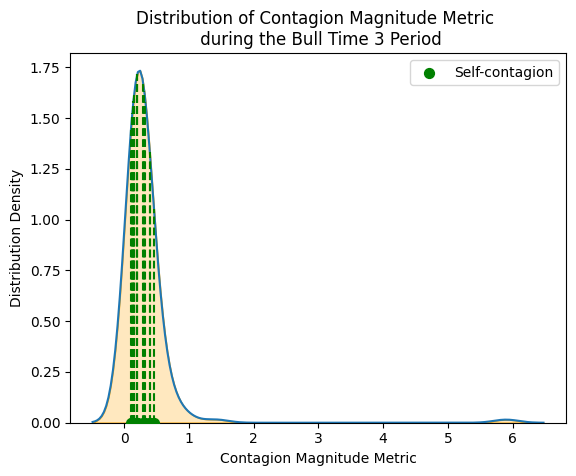

In [ ]:
# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Bull Time 3 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/Bull Time 3/statistical_test/Contagion_magnitude_distribution_Bull_time_3.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)
for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.32860521071165644, equivalent to 0.7720588235294117
Community 2: 0.1424619471342099, equivalent to 0.10294117647058823
Community 3: 0.4065431187345651, equivalent to 0.8529411764705882
Community 4: 0.14655008382516882, equivalent to 0.13970588235294118
Community 5: 0.45985862488627743, equivalent to 0.8897058823529411
Community 6: 0.20544330287856677, equivalent to 0.4411764705882353
Community 7: 0.31006113676585884, equivalent to 0.7352941176470588
Community 8: 0.14867448025906577, equivalent to 0.13970588235294118
Community 9: 0.12054530235617718, equivalent to 0.03676470588235294
Community 10: 0.2905942285485901, equivalent to 0.6838235294117647
Community 11: 0.10419185830780024, equivalent to 0.014705882352941176
Community 12: 0.15373331933563436, equivalent to 0.14705882352941177
Community 13: 0.12643236306232025, equivalent to 0.04411764705882353
Community 14: 0.13013464618438206, equivalent to 0.051470588235294115
Community 15: 0.19073472394512545, equivalent to 0

# U-R 1

In [26]:
off_diag_contagion_density6 = np.triu(np.ones_like(contagion_density_matrix_ped6, dtype=bool), k=1)
off_diag_values_contagion_density6 = contagion_density_matrix_ped6[off_diag_contagion_density6]
diagonal_contagion_density6 = np.diag(contagion_density_matrix_ped6)


off_diag_contagion_magnitude6 = np.triu(np.ones_like(contagion_magnitude_matrix_ped6, dtype=bool), k=1)
off_diag_values_contagion_magnitude6 = contagion_magnitude_matrix_ped6[off_diag_contagion_magnitude6]
diagonal_contagion_magnitude6 = np.diag(contagion_magnitude_matrix_ped6)


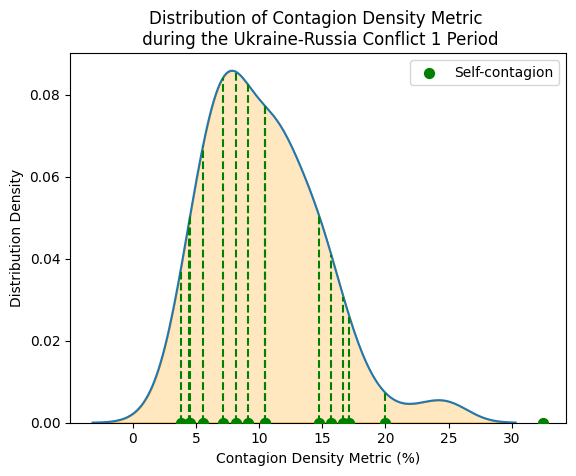

In [ ]:


# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Ukraine-Russia Conflict 1 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/U R 1/statistical_test/Contagion_density_distribution_U_R_1.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 5.555555555555555, equivalent to 0.13333333333333333
Community 2: 10.457516339869281, equivalent to 0.5142857142857143
Community 3: 16.666666666666664, equivalent to 0.9238095238095239
Community 4: 9.090909090909092, equivalent to 0.4571428571428572
Community 5: 7.142857142857142, equivalent to 0.2285714285714286
Community 6: 20.0, equivalent to 0.9714285714285715
Community 7: 3.787878787878788, equivalent to 0.01904761904761905
Community 8: 8.181818181818182, equivalent to 0.380952380952381
Community 9: 32.5, equivalent to 1.0
Community 10: 17.142857142857142, equivalent to 0.9333333333333333
Community 11: 10.43956043956044, equivalent to 0.5142857142857143
Community 12: 15.714285714285714, equivalent to 0.9047619047619048
Community 13: 4.545454545454546, equivalent to 0.04761904761904762
Community 14: 14.761904761904763, equivalent to 0.8380952380952381
Community 15: 4.444444444444445, equivalent to 0.04761904761904762


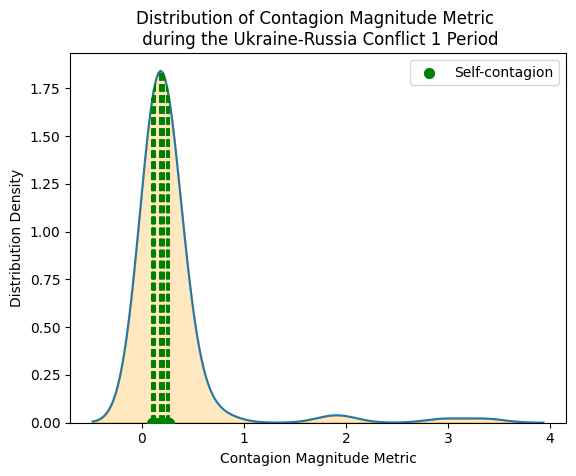

In [ ]:
# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Ukraine-Russia Conflict 1 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/U R 1/statistical_test/Contagion_magnitude_distribution_U_R_1.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)
for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.26203417631555953, equivalent to 0.8
Community 2: 0.10842854842921439, equivalent to 0.028571428571428574
Community 3: 0.25780531785118427, equivalent to 0.780952380952381
Community 4: 0.18984474286792752, equivalent to 0.5714285714285714
Community 5: 0.2528242837341252, equivalent to 0.7523809523809524
Community 6: 0.13276105294846755, equivalent to 0.1523809523809524
Community 7: 0.11920718299866266, equivalent to 0.05714285714285715
Community 8: 0.1075212340714769, equivalent to 0.028571428571428574
Community 9: 0.18993235548400197, equivalent to 0.5714285714285714
Community 10: 0.2122883373996044, equivalent to 0.6571428571428571
Community 11: 0.17938249164805822, equivalent to 0.5428571428571429
Community 12: 0.20419983166285097, equivalent to 0.6380952380952382
Community 13: 0.24409937985309696, equivalent to 0.7428571428571429
Community 14: 0.11582345385563433, equivalent to 0.04761904761904762
Community 15: 0.10280188953688711, equivalent to 0.009523809523809525


# U R 2

In [27]:
off_diag_contagion_density7 = np.triu(np.ones_like(contagion_density_matrix_ped7, dtype=bool), k=1)
off_diag_values_contagion_density7 = contagion_density_matrix_ped7[off_diag_contagion_density7]
diagonal_contagion_density7 = np.diag(contagion_density_matrix_ped7)


off_diag_contagion_magnitude7 = np.triu(np.ones_like(contagion_magnitude_matrix_ped7, dtype=bool), k=1)
off_diag_values_contagion_magnitude7 = contagion_magnitude_matrix_ped7[off_diag_contagion_magnitude7]
diagonal_contagion_magnitude7 = np.diag(contagion_magnitude_matrix_ped7)


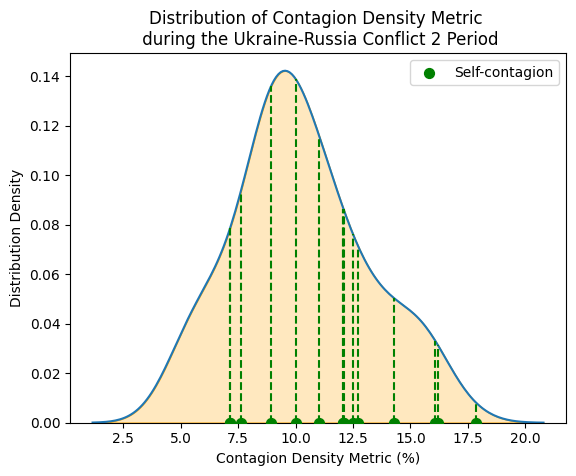

In [ ]:


# Plot the KDE
sns.kdeplot(off_diag_values_contagion_density, fill=True, color='orange')
plt.xlabel("Contagion Density Metric (%)")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Density Metric \n during the Ukraine-Russia Conflict 2 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_density).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_density, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_density, [0]*len(diagonal_contagion_density), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_density, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/U R 2/statistical_test/Contagion_density_distribution_U_R_2.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_density)
for e,v in enumerate(diagonal_contagion_density):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 7.602339181286549, equivalent to 0.17142857142857143
Community 2: 11.03896103896104, equivalent to 0.6476190476190476
Community 3: 12.5, equivalent to 0.8
Community 4: 7.142857142857142, equivalent to 0.13333333333333333
Community 5: 7.142857142857142, equivalent to 0.13333333333333333
Community 6: 12.083333333333334, equivalent to 0.7714285714285715
Community 7: 10.0, equivalent to 0.5333333333333333
Community 8: 16.071428571428573, equivalent to 0.9714285714285715
Community 9: 16.19047619047619, equivalent to 0.980952380952381
Community 10: 12.083333333333334, equivalent to 0.7714285714285715
Community 11: 17.83625730994152, equivalent to 1.0
Community 12: 14.285714285714285, equivalent to 0.8952380952380953
Community 13: 12.087912087912088, equivalent to 0.7714285714285715
Community 14: 12.727272727272727, equivalent to 0.8
Community 15: 8.928571428571429, equivalent to 0.3428571428571429


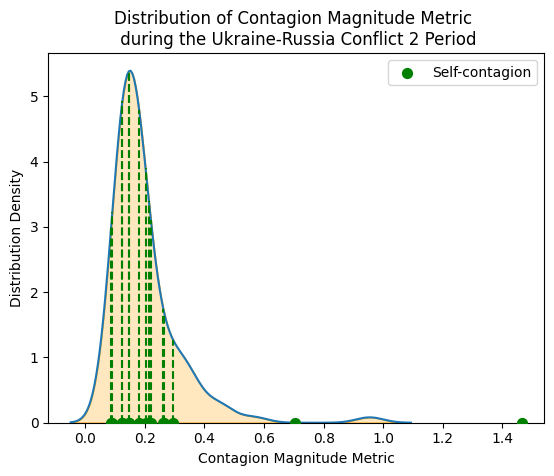

In [ ]:
# Plot the KDE
sns.kdeplot(off_diag_values_contagion_magnitude, fill=True, color='orange')
plt.xlabel("Contagion Magnitude Metric")
plt.ylabel("Distribution Density")
plt.title("Distribution of Contagion Magnitude Metric \n during the Ukraine-Russia Conflict 2 Period")


# Extract the KDE line data
kde = sns.kdeplot(off_diag_values_contagion_magnitude).get_lines()[0]
x_kde, y_kde = kde.get_data()

# Interpolate to find corresponding y values
y_values = np.interp(diagonal_contagion_magnitude, x_kde, y_kde)

# Scatter points at the bottom
plt.scatter(diagonal_contagion_magnitude, [0]*len(diagonal_contagion_magnitude), color='green', s=50, zorder=5,label='Self-contagion')

# Draw vertical lines from bottom to the KDE curve
for x, y in zip(diagonal_contagion_magnitude, y_values):
    plt.plot([x, x], [0, y], color='green', linestyle='--', linewidth=1.5)

plt.legend()
plt.savefig("drive/MyDrive/Project_5/contagion/U R 2/statistical_test/Contagion_magnitude_distribution_U_R_2.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()


In [ ]:
ecdf = ECDF(off_diag_values_contagion_magnitude)
for e,v in enumerate(diagonal_contagion_magnitude):
  print(f"Community {e+1}: {v}, equivalent to {ecdf(v)}")

Community 1: 0.7035270032643773, equivalent to 0.9904761904761905
Community 2: 0.0905723255906321, equivalent to 0.009523809523809525
Community 3: 0.08683216699637526, equivalent to 0.0
Community 4: 0.18072350282644803, equivalent to 0.6095238095238096
Community 5: 0.1470429585077822, equivalent to 0.4000000000000001
Community 6: 0.29505681329894656, equivalent to 0.8571428571428572
Community 7: 0.26567805611961887, equivalent to 0.8190476190476191
Community 8: 0.14653948686091112, equivalent to 0.4000000000000001
Community 9: 0.20197707401029513, equivalent to 0.7333333333333334
Community 10: 0.21339941129357107, equivalent to 0.7428571428571429
Community 11: 0.2620086613798626, equivalent to 0.8190476190476191
Community 12: 0.12296738234804033, equivalent to 0.1904761904761905
Community 13: 0.21998017053166688, equivalent to 0.7523809523809524
Community 14: 1.4646903532765598, equivalent to 1.0
Community 15: 0.12426170119626026, equivalent to 0.1904761904761905


# **Distributions Merged**

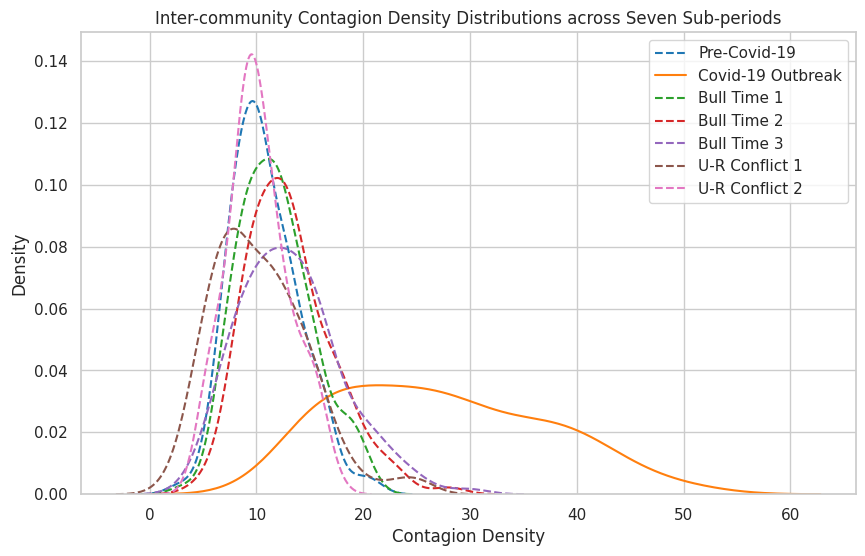

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example data
list1 = off_diag_values_contagion_density1
list2 = off_diag_values_contagion_density2
list3 = off_diag_values_contagion_density3
list4 = off_diag_values_contagion_density4
list5 = off_diag_values_contagion_density5
list6 = off_diag_values_contagion_density6
list7 = off_diag_values_contagion_density7
# Set plot style
sns.set(style="whitegrid")
colors = sns.color_palette("tab10", 7)
# Plot the KDE for each list
plt.figure(figsize=(10, 6))
sns.kdeplot(list1, label='Pre-Covid-19', linestyle = '--', fill=False, color=colors[0])
sns.kdeplot(list2, label='Covid-19 Outbreak', fill=False, color=colors[1])
sns.kdeplot(list3, label='Bull Time 1',linestyle = '--', fill=False, color=colors[2])
sns.kdeplot(list4, label='Bull Time 2', linestyle = '--',fill=False, color=colors[3])
sns.kdeplot(list5, label='Bull Time 3',linestyle = '--', fill=False, color=colors[4])
sns.kdeplot(list6, label='U-R Conflict 1',linestyle = '--', fill=False, color=colors[5])
sns.kdeplot(list7, label='U-R Conflict 2',linestyle = '--', fill=False, color=colors[6])
# Add legend and labels
plt.legend()
plt.title('Inter-community Contagion Density Distributions across Seven Sub-periods')
plt.xlabel('Contagion Density')
plt.ylabel('Density')
plt.savefig("Inter_contagion_density.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)


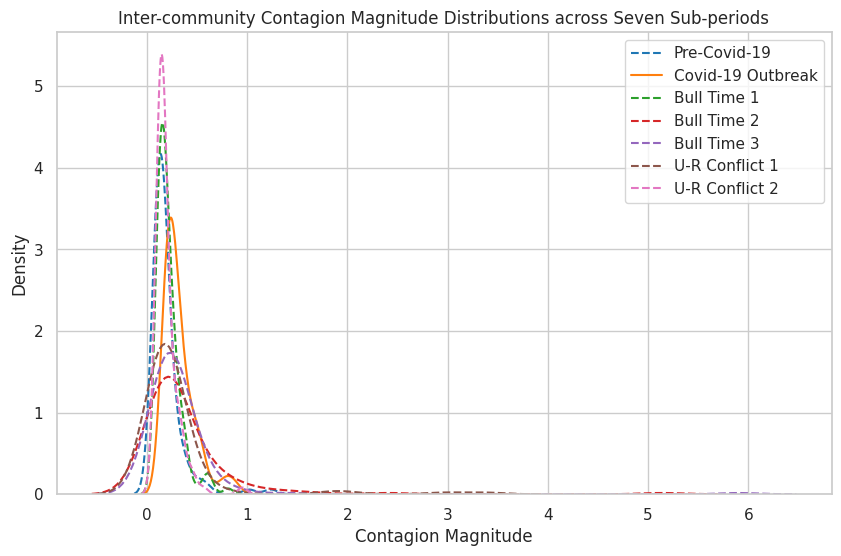

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example data
list1 = off_diag_values_contagion_magnitude1
list2 = off_diag_values_contagion_magnitude2
list3 = off_diag_values_contagion_magnitude3
list4 = off_diag_values_contagion_magnitude4
list5 = off_diag_values_contagion_magnitude5
list6 = off_diag_values_contagion_magnitude6
list7 = off_diag_values_contagion_magnitude7
# Set plot style
sns.set(style="whitegrid")
colors = sns.color_palette("tab10", 7)
# Plot the KDE for each list
plt.figure(figsize=(10, 6))
sns.kdeplot(list1, label='Pre-Covid-19', linestyle = '--', fill=False, color=colors[0])
sns.kdeplot(list2, label='Covid-19 Outbreak', fill=False, color=colors[1])
sns.kdeplot(list3, label='Bull Time 1', linestyle = '--', fill=False, color=colors[2])
sns.kdeplot(list4, label='Bull Time 2', linestyle = '--',fill=False, color=colors[3])
sns.kdeplot(list5, label='Bull Time 3', linestyle = '--',fill=False, color=colors[4])
sns.kdeplot(list6, label='U-R Conflict 1', linestyle = '--',fill=False, color=colors[5])
sns.kdeplot(list7, label='U-R Conflict 2',linestyle = '--', fill=False, color=colors[6])
# Add legend and labels
plt.legend()
plt.title('Inter-community Contagion Magnitude Distributions across Seven Sub-periods')
plt.xlabel('Contagion Magnitude')
plt.ylabel('Density')
plt.savefig("Inter_contagion_magnitude.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)


# **Results - RQ2**

In [ ]:
def contagion_cross_community_visualize(contagion_matrix, percent_keep, title_plot, save_fig = None):
  # Paste your matrix here (example for 5x5, replace with 17x17 matrix from your heatmap)
  influence_matrix = contagion_matrix.copy()  # Replace with your actual 17x17 matrix

  n = influence_matrix.shape[0]

  edges = [(i + 1, j + 1, influence_matrix[i, j])
          for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

  # Step 2: Sort edges by weight descending
  edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

  # Step 3: Keep top 50%
  num_edges_to_keep = round(len(edges_sorted)*percent_keep)
  top_edges = edges_sorted[:num_edges_to_keep]

  # Step 4: Create directed graph with top edges
  G = nx.DiGraph()
  G.add_nodes_from(range(1, n + 1))
  for u, v, w in top_edges:
      G.add_edge(u, v, weight=w)

  # Draw
  plt.figure(figsize = (15,15))
  pos = nx.spring_layout(G, k = 1.5)
  nx.draw_networkx_nodes(G, pos, node_color='cyan', node_size=500)
  nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

  # Edges (green = outbound, thickness ∝ weight)
  weights = [d['weight'] for _, _, d in G.edges(data=True)]
  max_weight = max(weights) if weights else 1

  nx.draw_networkx_edges(
      G, pos,
      edge_color='green',
      arrows=True, arrowsize=15, alpha=0.7
  )
  # After creating the graph G and adding the edges
  out_edges_count = dict(G.out_degree())
  in_edges_count = dict(G.in_degree())

  out_edges_dict = {}
  in_edges_dict = {}
  # print("Out-degree (number of outgoing edges) per node:")
  for node, count in out_edges_count.items():
      out_edges_dict[str(node)] = count

  # print("\nIn-degree (number of incoming edges) per node:")
  for node, count in in_edges_count.items():
      in_edges_dict[str(node)] = count

  out_edges_df = pd.DataFrame.from_dict(out_edges_dict,orient='index', columns = ["out_count"])
  in_edges_df = pd.DataFrame.from_dict(in_edges_dict,orient='index', columns = ["in_count"])
  density_count = pd.concat([in_edges_df,out_edges_df], axis = 1)

  plt.title(title_plot, fontsize = 16)
  plt.axis('off')
  if save_fig != None:
    plt.savefig(save_fig, bbox_inches='tight',pad_inches = 0.1)
    print("Figure was saved")
  plt.show()


  return density_count





# Pre-Covid

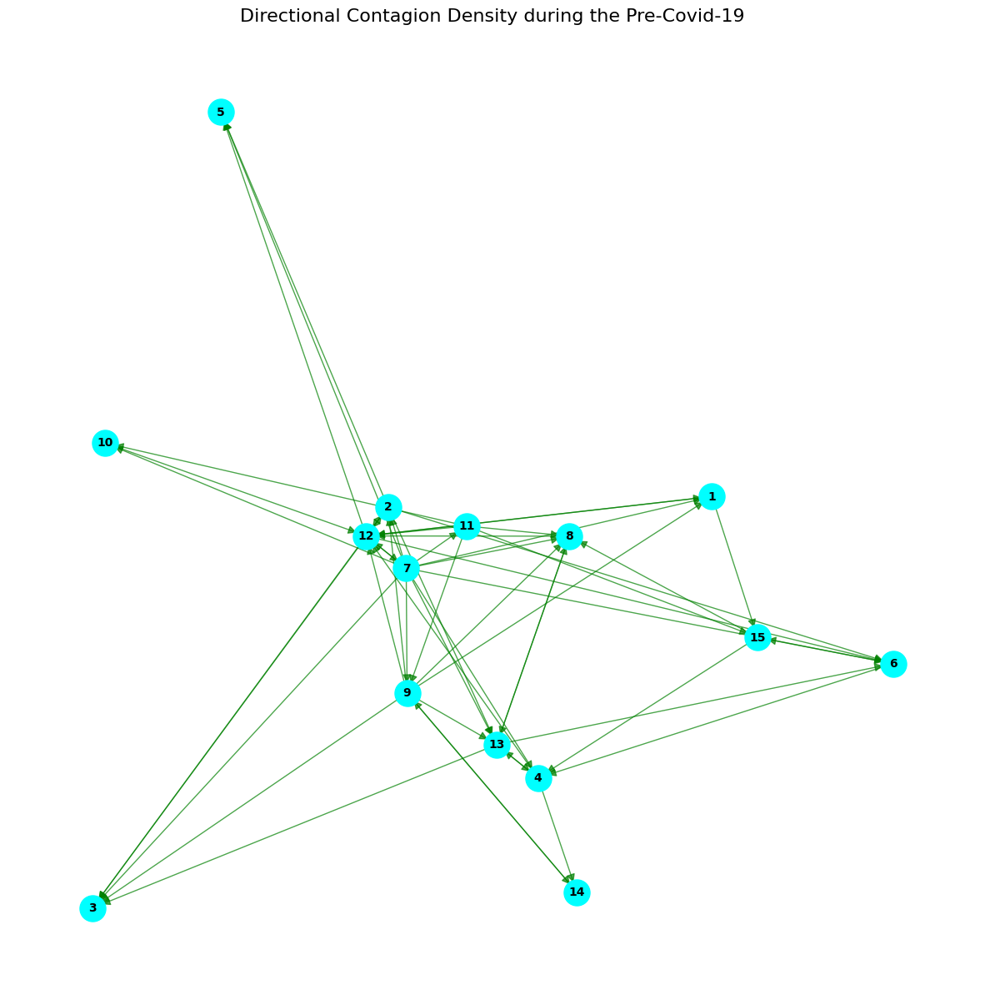

In [28]:
# Paste your matrix here (example for 5x5, replace with 17x17 matrix from your heatmap)
influence_matrix = directional_density_matrix_ped1  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 50%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)

# Draw
plt.figure(figsize = (15,15))
pos = nx.spring_layout(G, k = 1.5)
nx.draw_networkx_nodes(G, pos, node_color='cyan', node_size=500)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')

# Edges (green = outbound, thickness ∝ weight)
weights = [d['weight'] for _, _, d in G.edges(data=True)]
max_weight = max(weights) if weights else 1

nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=15, alpha=0.7
)



plt.title("Directional Contagion Density during the Pre-Covid-19", fontsize = 16)
plt.axis('off')
# plt.savefig("drive/MyDrive/Project_5/contagion/Pre-Covid/directional_density_Pre_Covid.png", bbox_inches='tight',pad_inches = 0.1)
plt.show()




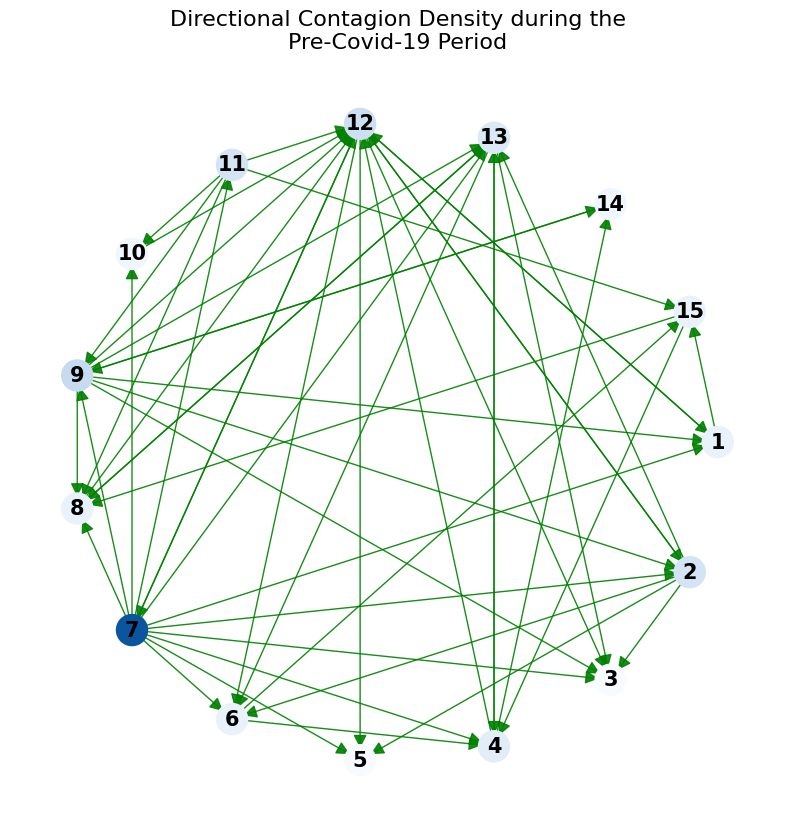

In [21]:
influence_matrix = directional_density_matrix_ped1  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 50%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)

# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nPre-Covid-19 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_Pre_Covid.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



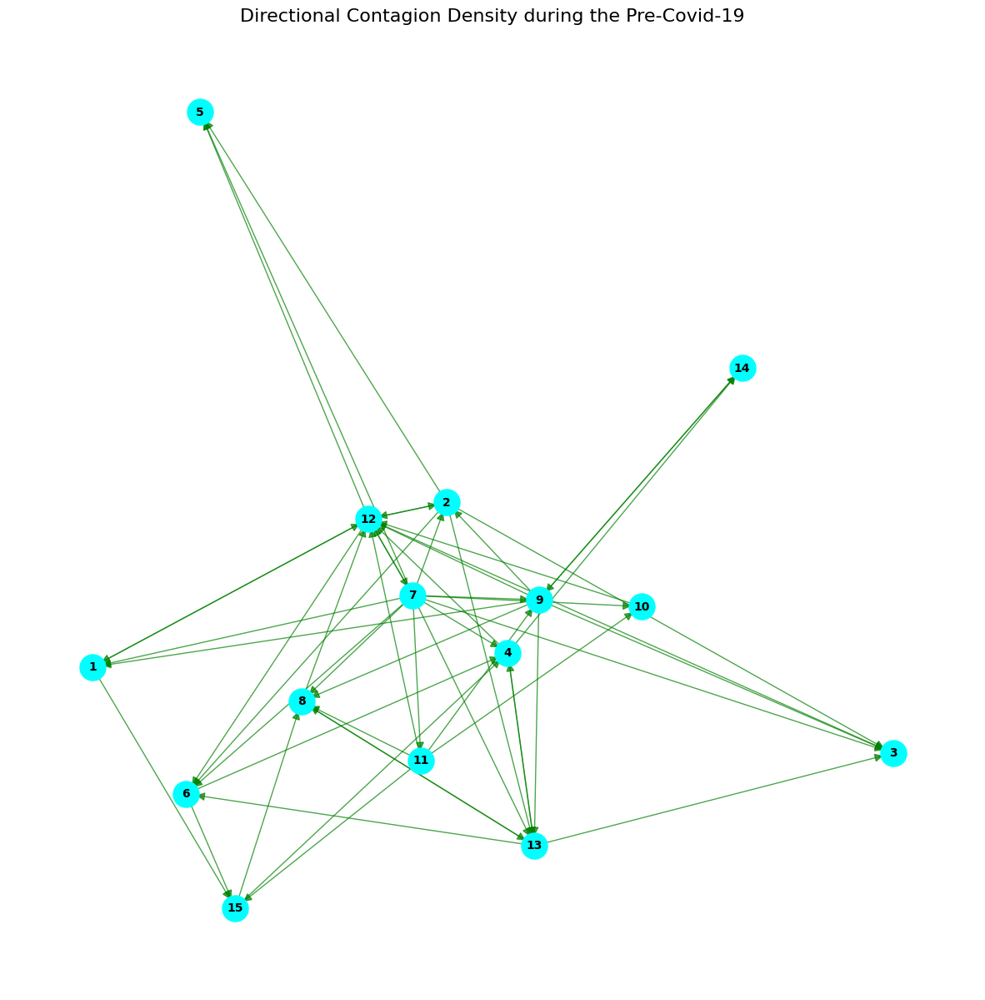

In [ ]:
# density_count_dict_ped1 = contagion_cross_community_visualize(directional_density_matrix_ped1, 0.25, "Directional Contagion Density during the Pre-Covid-19", save_fig = "drive/MyDrive/Project_5/contagion/Pre-Covid/directional_density_Pre_Covid.png")
density_count_dict_ped1 = contagion_cross_community_visualize(directional_density_matrix_ped1, 0.25, "Directional Contagion Density during the Pre-Covid-19")

In [ ]:
density_count_dict_ped1["out_average_score"] = directional_density_matrix_ped1.sum(axis = 1)/(len(directional_density_matrix_ped1) - 1) # outbound contagion
density_count_dict_ped1["in_average_score"] = directional_density_matrix_ped1.sum(axis = 0)/(len(directional_density_matrix_ped1) - 1) # outbound contagion


array([[ 0.        ,  7.63888889,  6.98529412,  5.46875   ,  5.859375  ,
        10.22727273,  5.20833333,  6.25      ,  5.76923077,  9.65909091,
         7.14285714, 13.54166667,  8.17307692, 11.16071429, 13.88888889],
       [12.15277778,  0.        , 16.0130719 , 13.19444444, 23.26388889,
        19.19191919, 12.03703704,  7.5       ,  8.97435897,  8.58585859,
        10.31746032, 23.61111111, 17.52136752,  8.73015873, 10.49382716],
       [ 8.45588235, 10.45751634,  0.        ,  8.08823529,  9.55882353,
         8.02139037, 11.2745098 ,  8.82352941,  6.33484163,  6.95187166,
         5.04201681,  9.80392157, 10.85972851,  7.56302521, 12.41830065],
       [10.546875  ,  7.98611111, 11.76470588,  0.        ,  9.375     ,
         6.81818182, 13.02083333,  9.6875    , 12.5       , 11.36363636,
         7.14285714, 15.10416667, 14.42307692, 13.39285714, 12.15277778],
       [ 7.8125    ,  5.55555556,  8.82352941,  6.25      ,  0.        ,
         7.95454545,  5.20833333,  5.3125    , 

Figure was saved


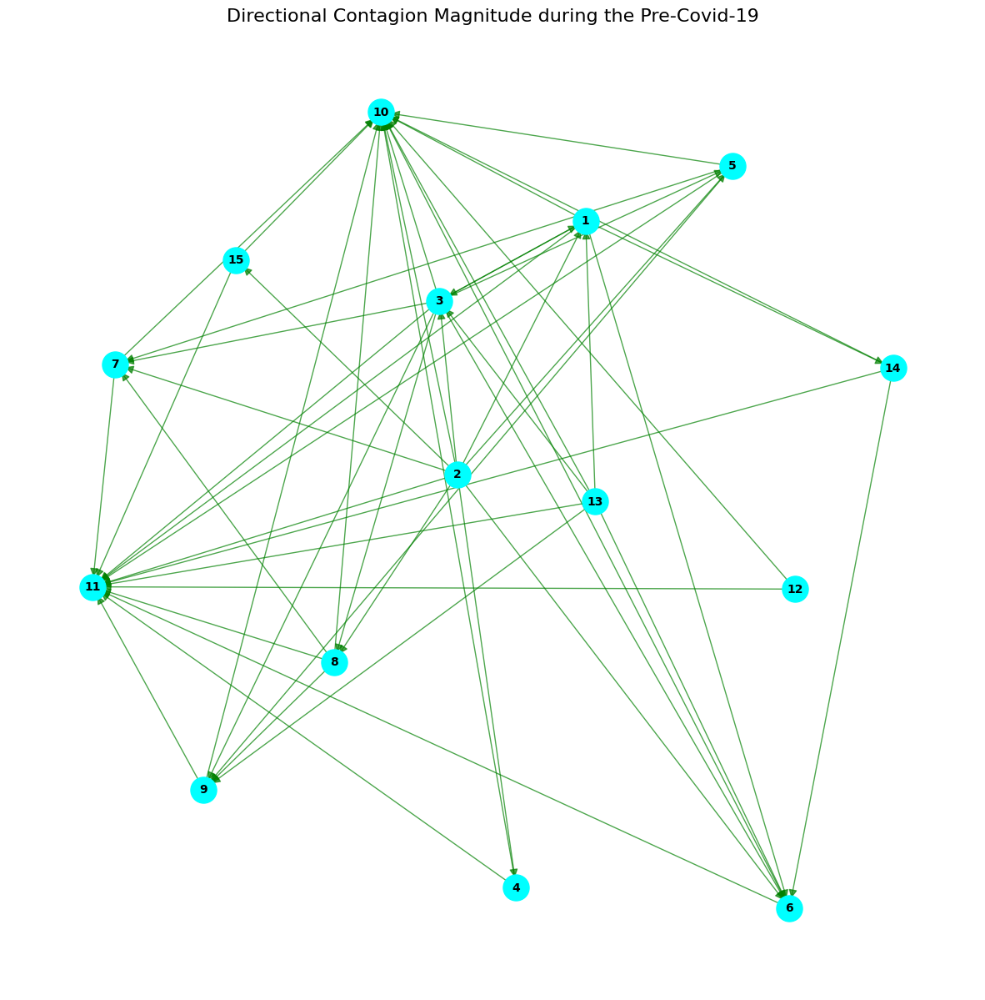

In [ ]:
# magnitude_count_dict_ped1 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped1, 0.25, "Directional Contagion Magnitude during the Pre-Covid-19", save_fig = "drive/MyDrive/Project_5/contagion/Pre-Covid/directional_magnitude_Pre_Covid.png")
magnitude_count_dict_ped1 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped1, 0.25, "Directional Contagion Magnitude during the Pre-Covid-19", save_fig = "drive/MyDrive/Project_5/contagion/Pre-Covid/directional_magnitude_Pre_Covid.png")

In [ ]:
magnitude_count_dict_ped1["out_average_score"] = contagion_magnitude_transmitter_matrix_ped1.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped1) - 1) # outbound contagion
magnitude_count_dict_ped1["in_average_score"] = contagion_magnitude_transmitter_matrix_ped1.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped1) - 1) # outbound contagion


In [ ]:
magnitude_count_dict_ped1

,in_count,out_count,out_average_score,in_average_score
1,3,5,0.243943,0.188568
2,0,10,0.443154,0.108194
3,3,8,0.540030,0.177218
4,1,2,0.129437,0.134112
5,2,4,0.217653,0.131746
6,5,2,0.117530,0.200238
7,4,2,0.147923,0.174140
8,2,4,0.280649,0.144424
9,4,2,0.183299,0.145386
10,13,0,0.048164,0.848119


**Average score**

# Covid

Figure was saved


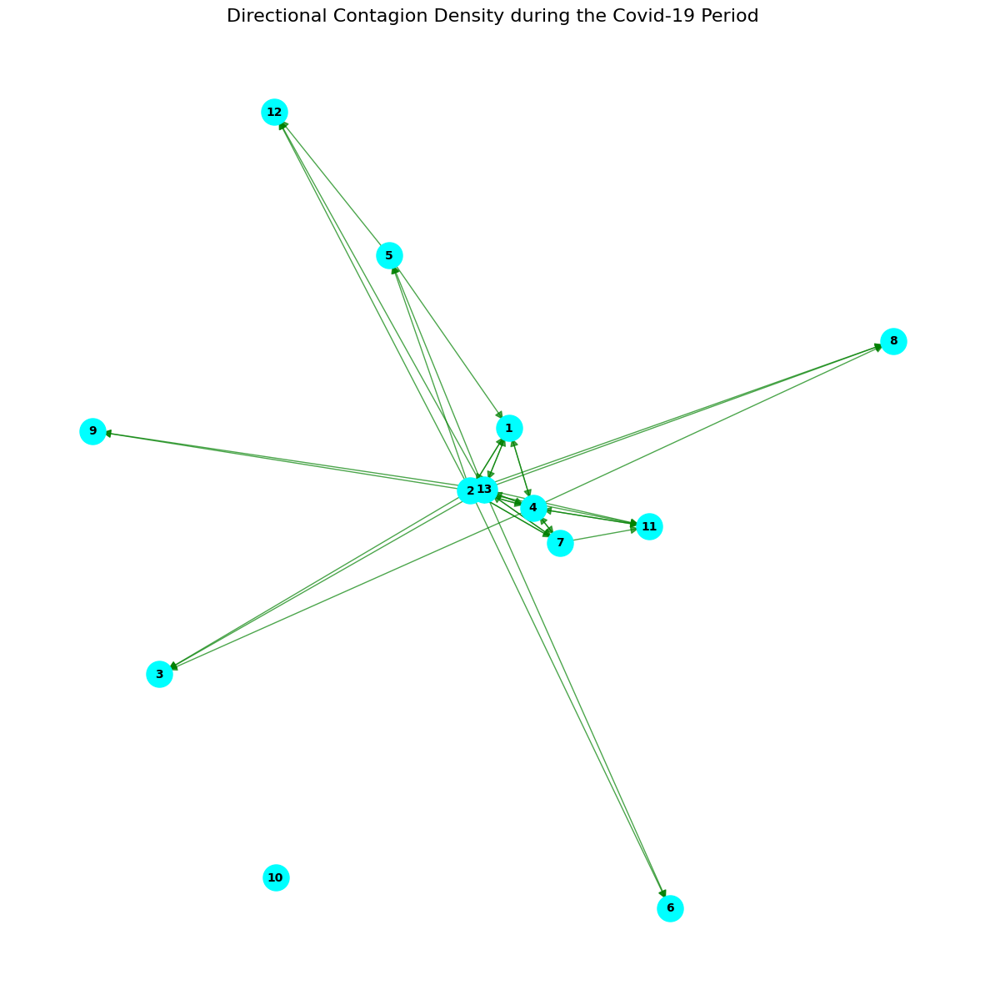

In [ ]:
density_count_dict_ped2 = contagion_cross_community_visualize(directional_density_matrix_ped2, 0.25, "Directional Contagion Density during the Covid-19 Period", save_fig = "drive/MyDrive/Project_5/contagion/Covid/directional_density_Covid.png")

In [ ]:
density_count_dict_ped2["out_average_score"] = directional_density_matrix_ped2.sum(axis = 1)/(len(directional_density_matrix_ped2) - 1) # outbound contagion
density_count_dict_ped2["in_average_score"] = directional_density_matrix_ped2.sum(axis = 0)/(len(directional_density_matrix_ped2) - 1) # outbound contagion


In [ ]:
density_count_dict_ped2

,in_count,out_count,out_average_score,in_average_score
1,4,3,31.936808,28.467571
2,4,11,45.460264,28.879413
3,3,0,27.876213,29.057761
4,5,7,33.118767,31.359929
5,2,2,27.065279,26.434067
6,2,0,20.355257,27.892214
7,3,4,29.095270,29.493514
8,3,0,19.291561,27.702717
9,2,0,17.909516,23.581760
10,0,0,14.607542,19.191561


Figure was saved


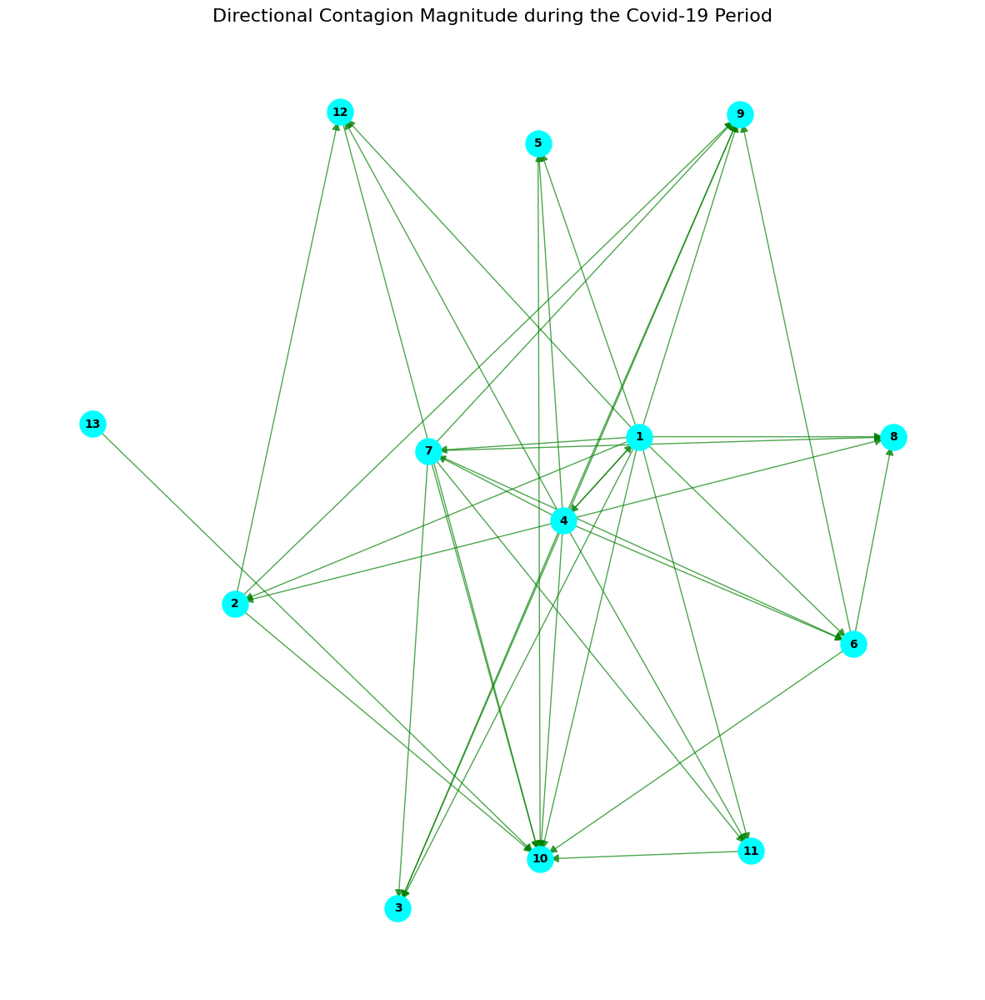

In [ ]:
magnitude_count_dict_ped2 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped2, 0.25, "Directional Contagion Magnitude during the Covid-19 Period", save_fig = "drive/MyDrive/Project_5/contagion/Covid/directional_magnitude_Covid.png")

In [ ]:
magnitude_count_dict_ped2["out_average_score"] = contagion_magnitude_transmitter_matrix_ped2.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped2) - 1) # outbound contagion
magnitude_count_dict_ped2["in_average_score"] = contagion_magnitude_transmitter_matrix_ped2.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped2) - 1) # outbound contagion


**New Visualization for Directional Contagion Density**

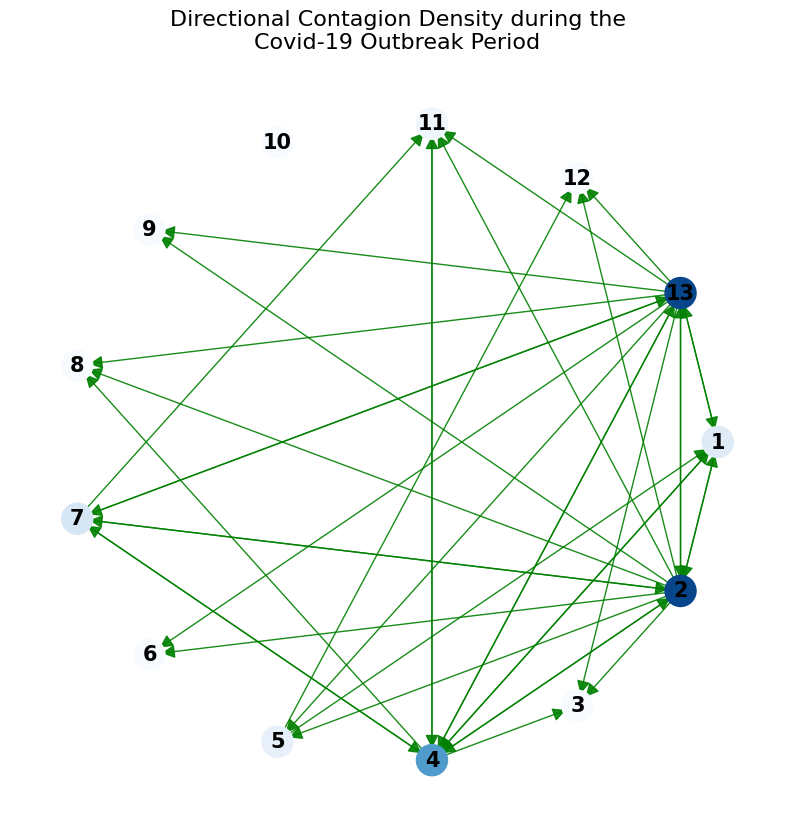

In [44]:
influence_matrix = directional_density_matrix_ped2  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 50%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)

# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nCovid-19 Outbreak Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_Covid.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



In [ ]:
magnitude_count_dict_ped2

,in_count,out_count,out_average_score,in_average_score
1,1,11,0.591388,0.209827
2,2,3,0.349735,0.234508
3,3,1,0.287482,0.327066
4,1,11,0.857814,0.283277
5,2,1,0.304809,0.314425
6,3,3,0.370264,0.366520
7,2,6,0.402610,0.269563
8,4,0,0.181154,0.374855
9,6,0,0.178181,0.480887
10,9,0,0.090615,0.603491


# Bull Time 1

Figure was saved


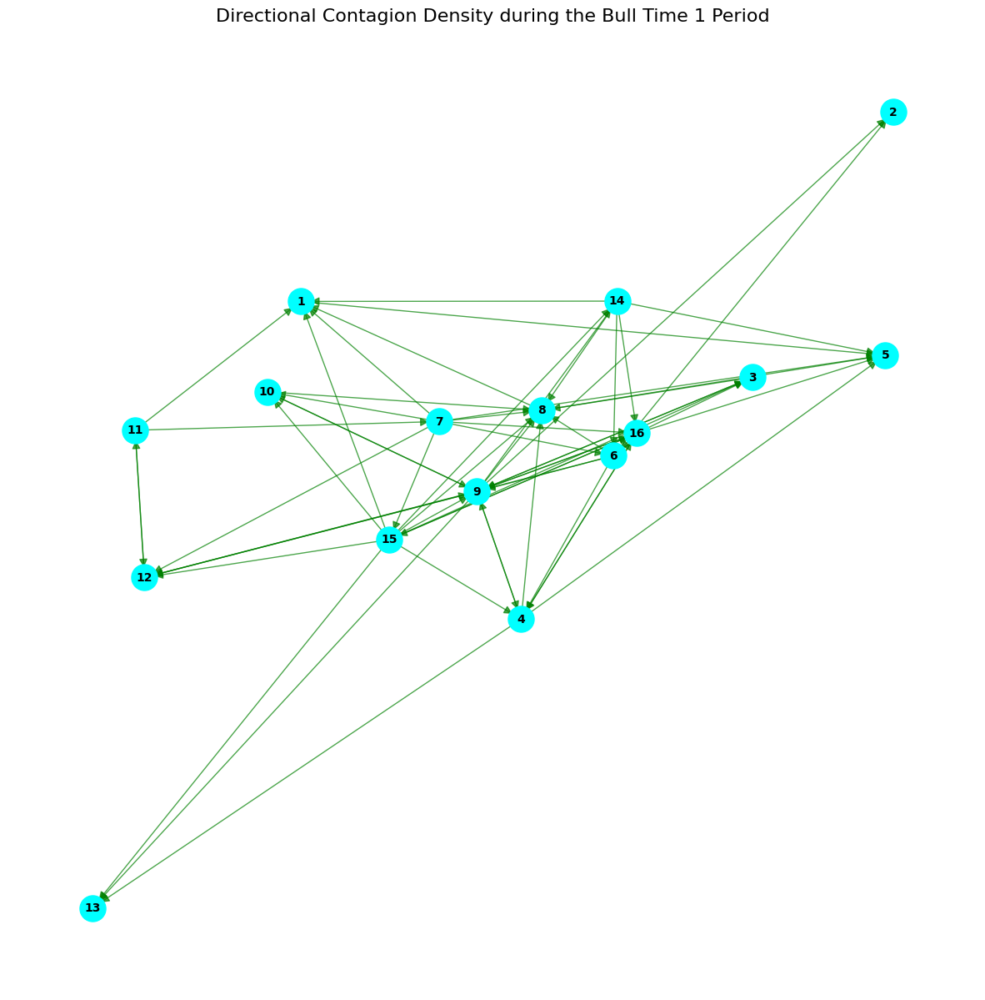

In [ ]:
density_count_dict_ped3 = contagion_cross_community_visualize(directional_density_matrix_ped3, 0.25, "Directional Contagion Density during the Bull Time 1 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 1/directional_density_Bull_time_1.png")

In [ ]:
density_count_dict_ped3["out_average_score"] = directional_density_matrix_ped3.sum(axis = 1)/(len(directional_density_matrix_ped3) - 1) # outbound contagion
density_count_dict_ped3["in_average_score"] = directional_density_matrix_ped3.sum(axis = 0)/(len(directional_density_matrix_ped3) - 1) # outbound contagion

In [ ]:
density_count_dict_ped3

,in_count,out_count,out_average_score,in_average_score
1,5,1,11.234782,11.775183
2,2,0,7.544421,11.882662
3,3,2,10.296564,11.404570
4,4,5,12.324028,12.164397
5,6,0,9.033324,11.793065
6,3,5,13.669603,11.011429
7,1,8,16.363459,9.825751
8,8,2,10.240088,15.139200
9,7,9,16.211505,13.491450
10,3,2,10.171524,11.864908


Figure was saved


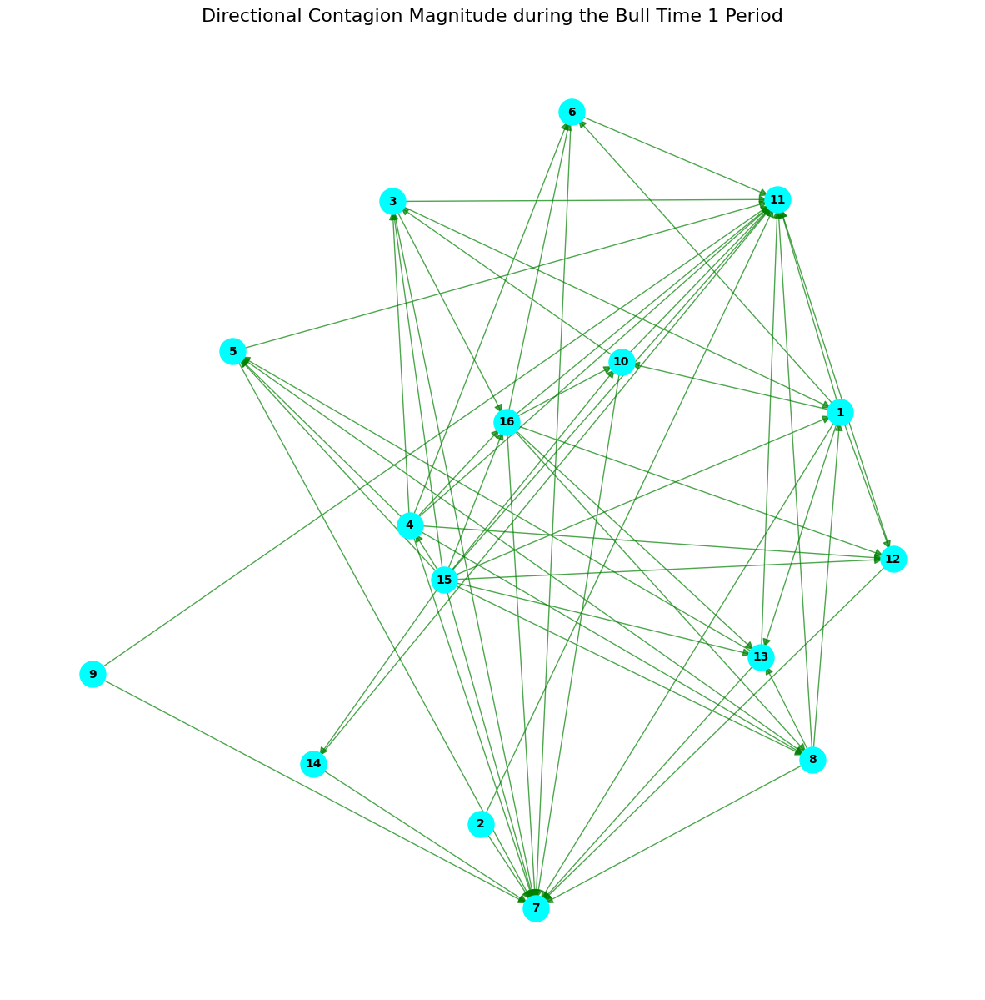

In [ ]:
magnitude_count_dict_ped3 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped3, 0.25, "Directional Contagion Magnitude during the Bull Time 1 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 1/directional_magnitude_Bull_time_1.png")

In [ ]:
magnitude_count_dict_ped3["out_average_score"] = contagion_magnitude_transmitter_matrix_ped3.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped3) - 1) # outbound contagion
magnitude_count_dict_ped3["in_average_score"] = contagion_magnitude_transmitter_matrix_ped3.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped3) - 1) # outbound contagion

In [ ]:
magnitude_count_dict_ped3

,in_count,out_count,out_average_score,in_average_score
1,3,6,0.341530,0.187109
2,0,2,0.174635,0.120980
3,3,4,0.233233,0.147837
4,1,8,0.374642,0.151549
5,4,2,0.193019,0.190711
6,3,2,0.192353,0.166518
7,14,0,0.043024,0.835861
8,3,5,0.299480,0.195909
9,0,2,0.224207,0.119912
10,3,3,0.322893,0.154388


**New Visualization for the Directional Contagion Density**

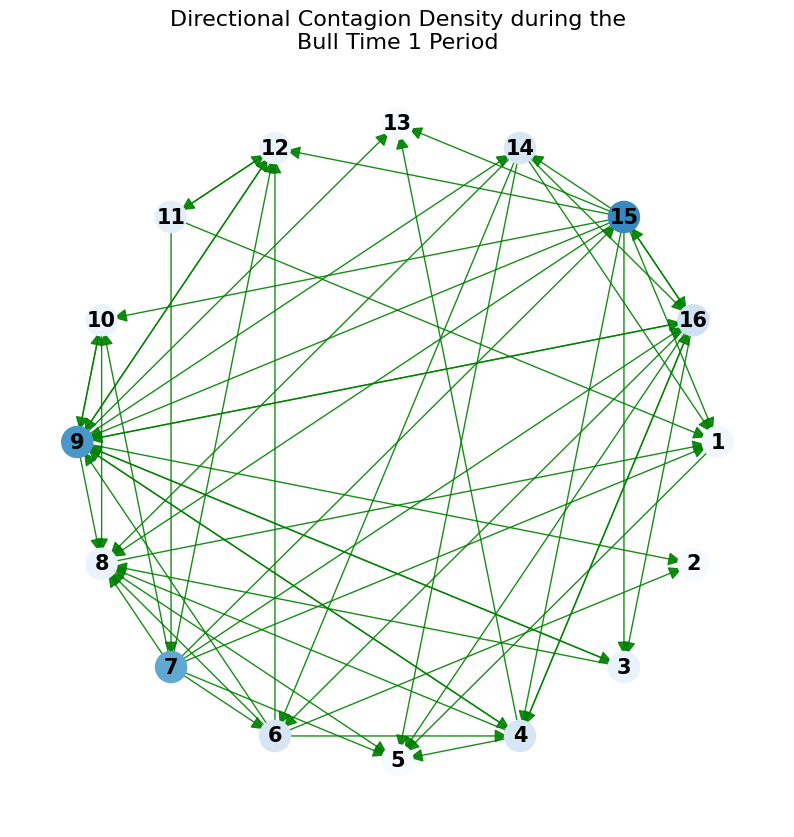

In [43]:
influence_matrix = directional_density_matrix_ped3  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 50%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)

# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nBull Time 1 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_Bull_1.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



# Bull Time 2

Figure was saved


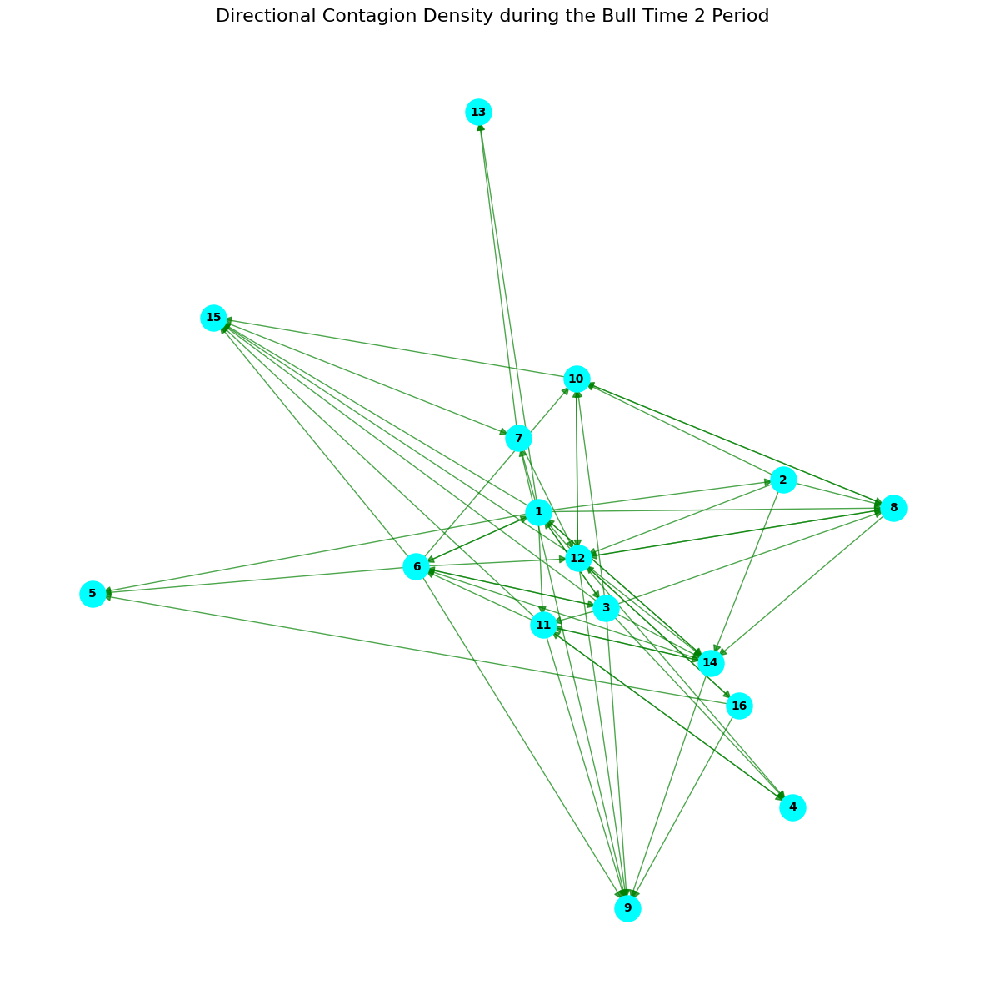

In [ ]:
density_count_dict_ped4 = contagion_cross_community_visualize(directional_density_matrix_ped4, 0.25, "Directional Contagion Density during the Bull Time 2 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 2/directional_density_Bull_time_2.png")

In [ ]:
density_count_dict_ped4["out_average_score"] = directional_density_matrix_ped4.sum(axis = 1)/(len(directional_density_matrix_ped4) - 1) # outbound contagion
density_count_dict_ped4["in_average_score"] = directional_density_matrix_ped4.sum(axis = 0)/(len(directional_density_matrix_ped4) - 1) # outbound contagion

In [ ]:
density_count_dict_ped4

,in_count,out_count,out_average_score,in_average_score
1,3,11,18.246845,13.971910
2,1,4,13.845662,11.804546
3,2,9,17.147087,12.087784
4,3,1,10.559528,13.179620
5,3,0,10.833884,12.964214
6,4,7,14.841896,12.790058
7,2,3,12.945742,11.372908
8,5,3,13.456263,13.251761
9,7,0,9.488314,14.933270
10,5,3,13.346670,13.190307


Figure was saved


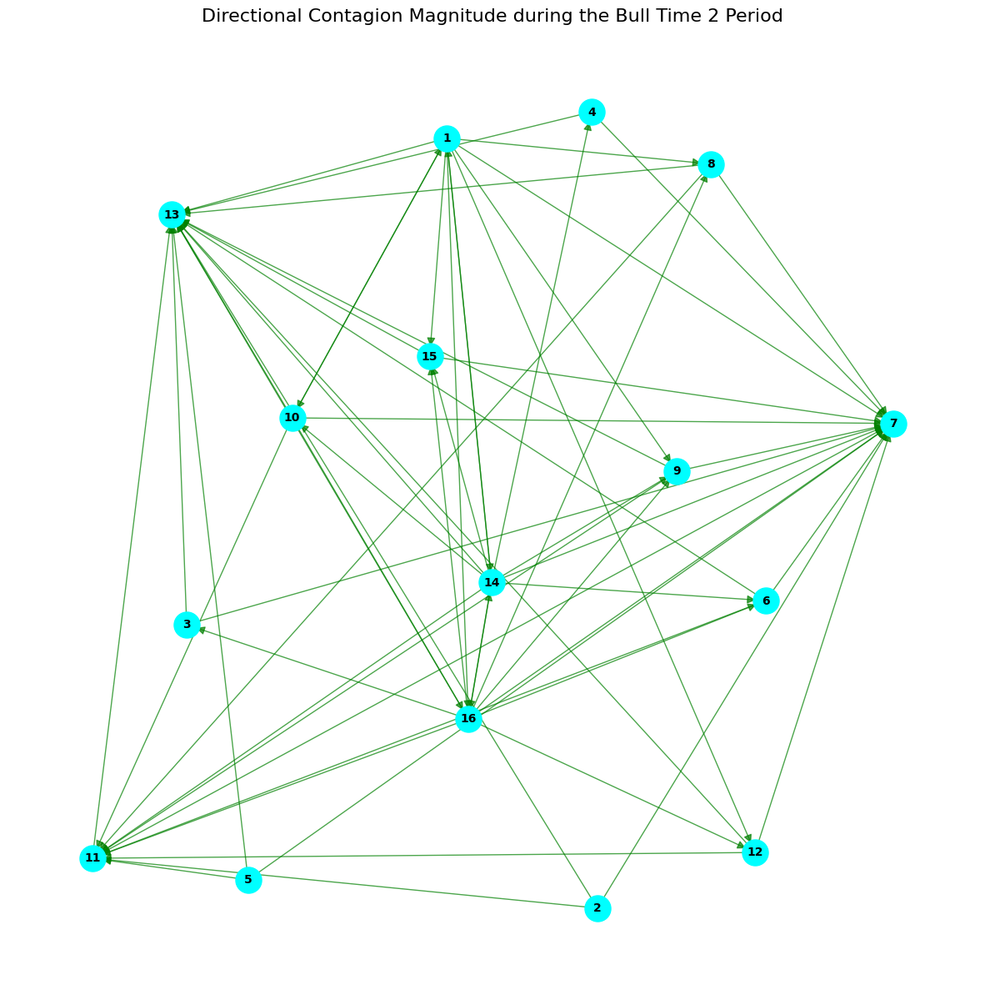

In [ ]:
magnitude_count_dict_ped4 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped4, 0.25, "Directional Contagion Magnitude during the Bull Time 2 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 2/directional_magnitude_Bull_time_2.png")

In [ ]:
magnitude_count_dict_ped4["out_average_score"] = contagion_magnitude_transmitter_matrix_ped4.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped4) - 1) # outbound contagion
magnitude_count_dict_ped4["in_average_score"] = contagion_magnitude_transmitter_matrix_ped4.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped4) - 1) # outbound contagion

In [ ]:
magnitude_count_dict_ped4

,in_count,out_count,out_average_score,in_average_score
1,2,9,0.485190,0.177588
2,0,3,0.293004,0.124974
3,1,2,0.374553,0.173628
4,1,2,0.227648,0.141963
5,0,3,0.292978,0.107359
6,2,3,0.427508,0.248464
7,14,0,0.035260,1.763682
8,2,3,0.321254,0.194215
9,3,3,0.530732,0.210454
10,2,5,0.475960,0.198804


**New Visualization for the Directional Contagion Density**

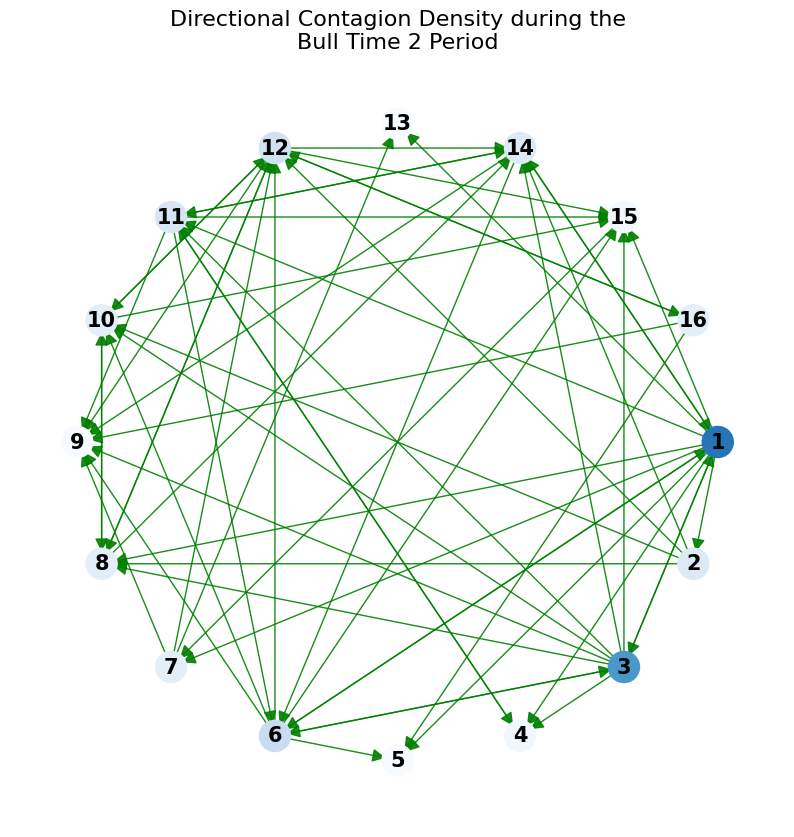

In [42]:
influence_matrix = directional_density_matrix_ped4  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 25%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)

# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1
percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)
plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nBull Time 2 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_Bull_2.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



# Bull Time 3

Figure was saved


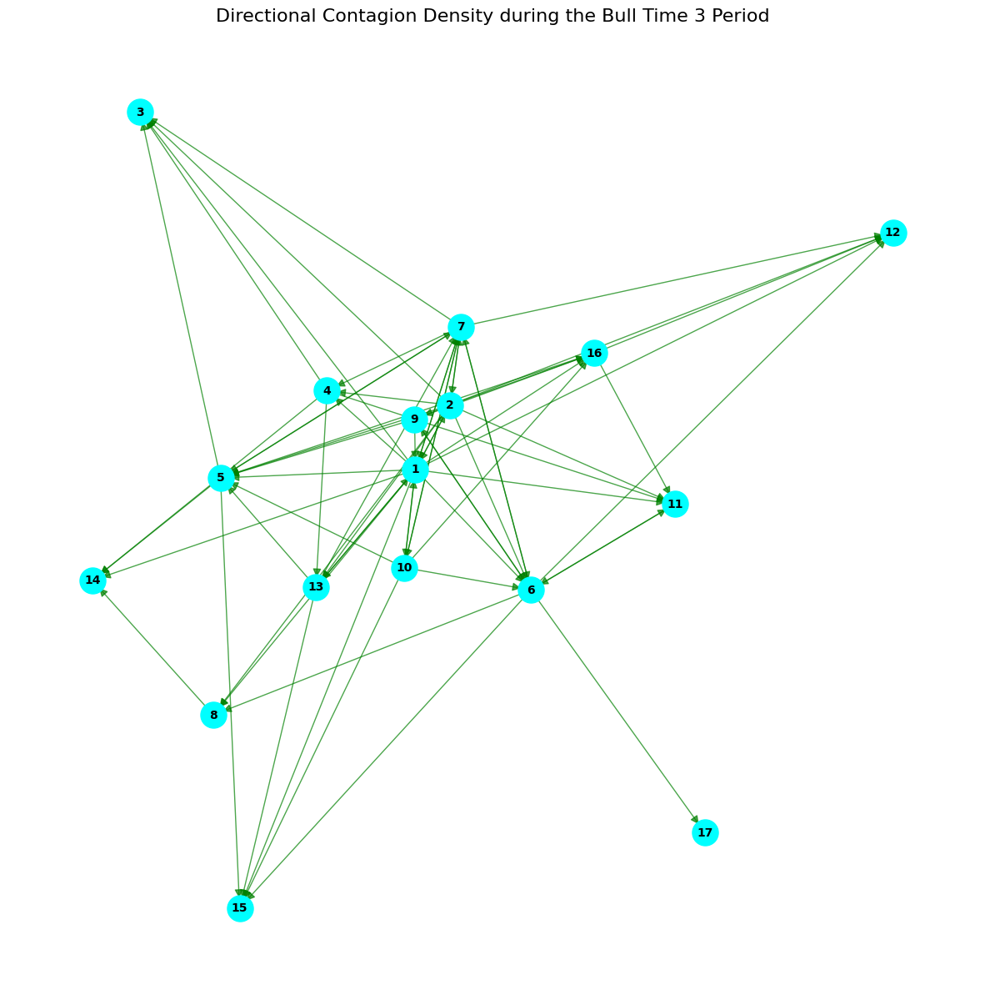

In [ ]:
density_count_dict_ped5 = contagion_cross_community_visualize(directional_density_matrix_ped5, 0.25, "Directional Contagion Density during the Bull Time 3 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 3/directional_density_Bull_time_3.png")
density_count_dict_ped5["out_average_score"] = directional_density_matrix_ped5.sum(axis = 1)/(len(directional_density_matrix_ped5) - 1) # outbound contagion
density_count_dict_ped5["in_average_score"] = directional_density_matrix_ped5.sum(axis = 0)/(len(directional_density_matrix_ped5) - 1) # outbound contagion

Figure was saved


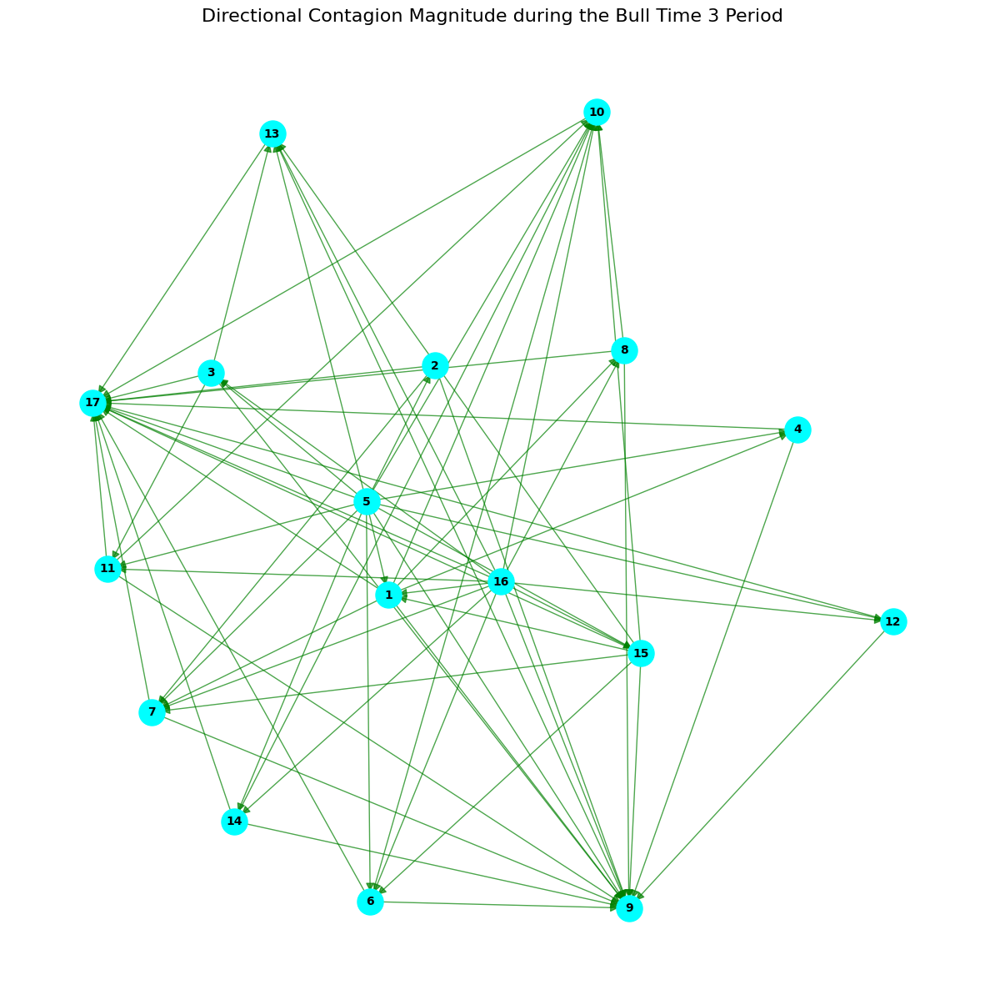

In [ ]:
magnitude_count_dict_ped5 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped5, 0.25, "Directional Contagion Magnitude during the Bull Time 3 Period", save_fig = "drive/MyDrive/Project_5/contagion/Bull Time 3/directional_magnitude_Bull_time_3.png")
magnitude_count_dict_ped5["out_average_score"] = contagion_magnitude_transmitter_matrix_ped5.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped5) - 1) # outbound contagion
magnitude_count_dict_ped5["in_average_score"] = contagion_magnitude_transmitter_matrix_ped5.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped5) - 1) # outbound contagion

In [ ]:
density_count_dict_ped5

,in_count,out_count,out_average_score,in_average_score
1,5,14,23.754011,14.404414
2,2,12,20.101176,12.567113
3,5,0,9.107141,12.869930
4,3,4,13.989523,12.962272
5,7,4,12.514327,15.874587
6,6,7,16.498831,14.010314
7,6,8,16.725922,14.626733
8,3,1,11.643937,11.827379
9,2,4,14.530473,9.814406
10,2,6,15.001442,11.454442


In [ ]:
magnitude_count_dict_ped5

,in_count,out_count,out_average_score,in_average_score
1,3,6,0.552715,0.228432
2,1,3,0.318953,0.199580
3,2,4,0.349406,0.215515
4,2,2,0.249005,0.206930
5,0,14,1.159747,0.174309
6,3,3,0.271234,0.279485
7,5,2,0.231434,0.291079
8,2,3,0.282657,0.194565
9,14,0,0.061538,0.842364
10,8,1,0.177342,0.469571


New Visualization for Directional Contagion Density

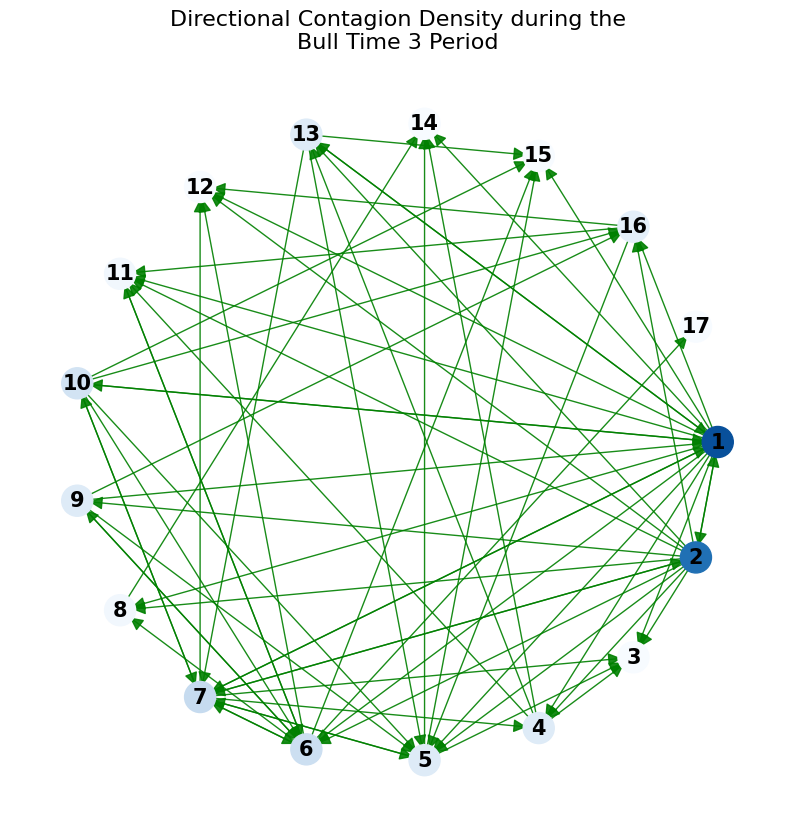

In [41]:
influence_matrix = directional_density_matrix_ped5  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 25%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)


# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nBull Time 3 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_Bull_3.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



# U R 1

Figure was saved


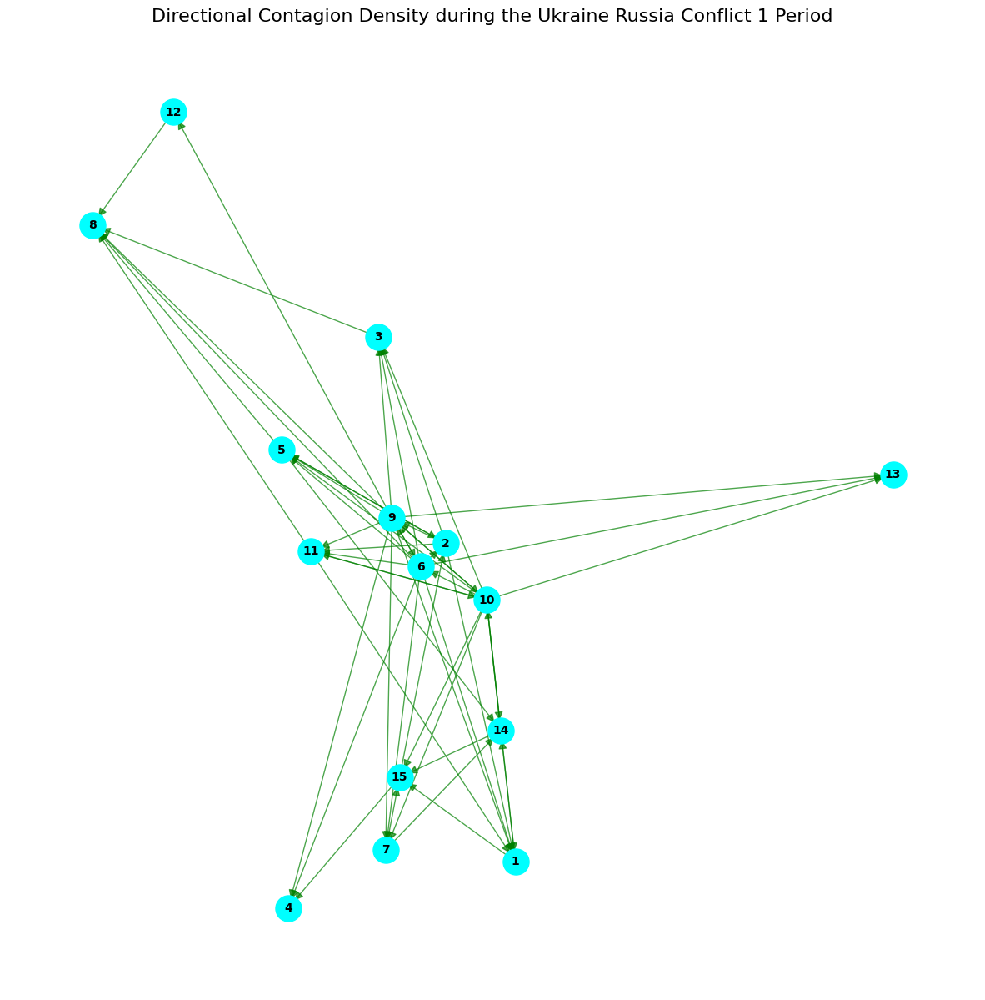

In [ ]:
density_count_dict_ped6 = contagion_cross_community_visualize(directional_density_matrix_ped6, 0.25, "Directional Contagion Density during the Ukraine Russia Conflict 1 Period", save_fig = "drive/MyDrive/Project_5/contagion/U R 1/directional_density_U_R_1.png")
density_count_dict_ped6["out_average_score"] = directional_density_matrix_ped6.sum(axis = 1)/(len(directional_density_matrix_ped6) - 1) # outbound contagion
density_count_dict_ped6["in_average_score"] = directional_density_matrix_ped6.sum(axis = 0)/(len(directional_density_matrix_ped6) - 1) # outbound contagion

In [ ]:
density_count_dict_ped6

,in_count,out_count,out_average_score,in_average_score
1,5,2,8.543640,10.758830
2,3,5,11.347618,9.450069
3,4,1,10.056684,11.750908
4,3,0,7.494470,11.391183
5,4,3,8.659033,10.711666
6,2,10,17.441544,9.218637
7,3,2,4.953413,10.477883
8,6,0,8.337640,11.500633
9,3,11,20.799553,10.633057
10,3,10,17.781809,10.516878


Figure was saved


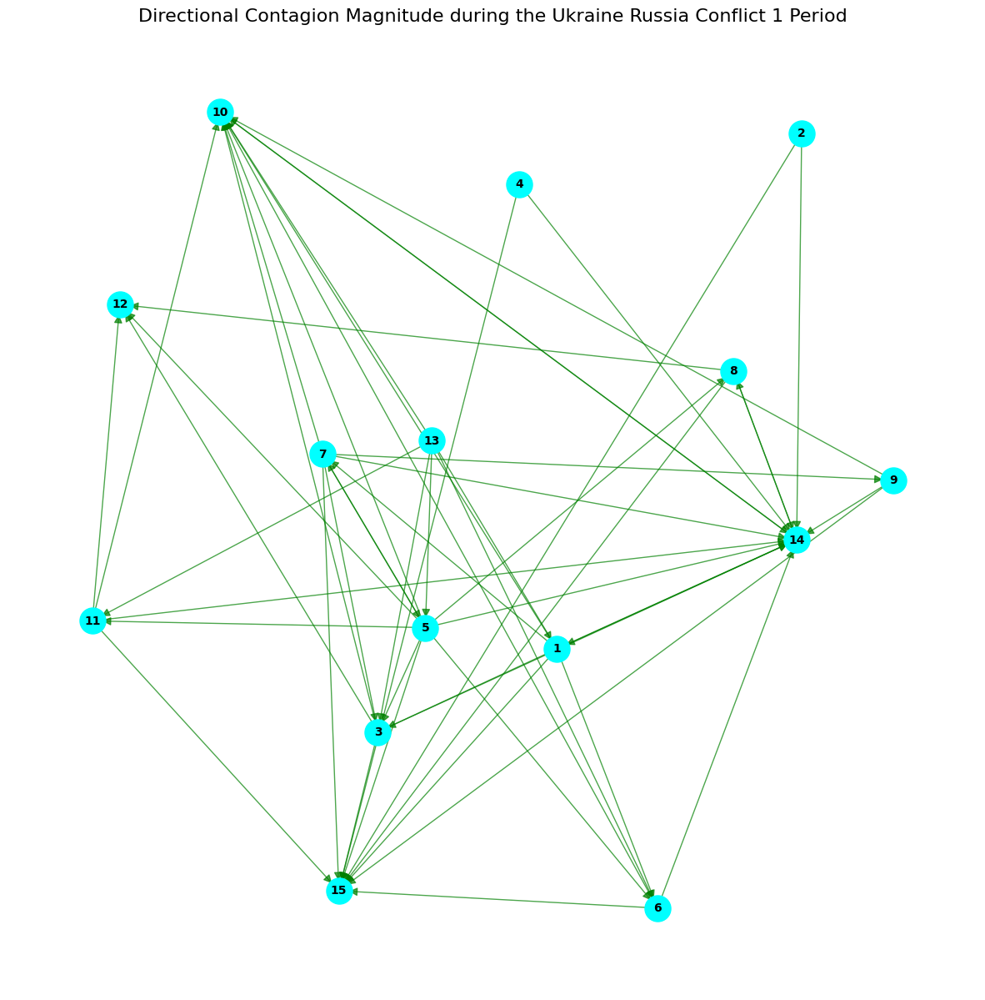

In [ ]:
magnitude_count_dict_ped6 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped6, 0.25, "Directional Contagion Magnitude during the Ukraine Russia Conflict 1 Period", save_fig = "drive/MyDrive/Project_5/contagion/U R 1/directional_magnitude_U_R_1.png")
magnitude_count_dict_ped6["out_average_score"] = contagion_magnitude_transmitter_matrix_ped6.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped6) - 1) # outbound contagion
magnitude_count_dict_ped6["in_average_score"] = contagion_magnitude_transmitter_matrix_ped6.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped6) - 1) # outbound contagion

In [ ]:
magnitude_count_dict_ped6

,in_count,out_count,out_average_score,in_average_score
1,2,6,0.661934,0.193189
2,0,2,0.175770,0.136719
3,4,4,0.303351,0.193729
4,0,2,0.194346,0.132972
5,2,9,1.070378,0.190000
6,3,3,0.166178,0.216017
7,2,6,0.302921,0.153583
8,2,3,0.268293,0.128030
9,1,3,0.240471,0.166910
10,9,1,0.128582,0.455611


New Visualization for Directional Contagion Density

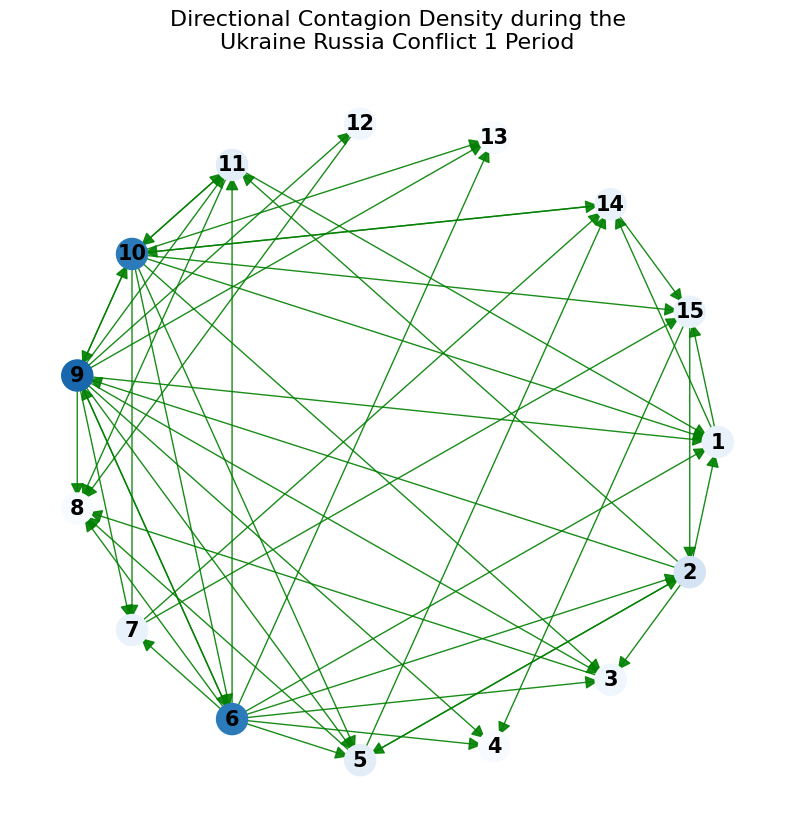

In [40]:
influence_matrix = directional_density_matrix_ped6  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 25%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)


# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nUkraine Russia Conflict 1 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_U_K_1.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)



# U R 2

Figure was saved


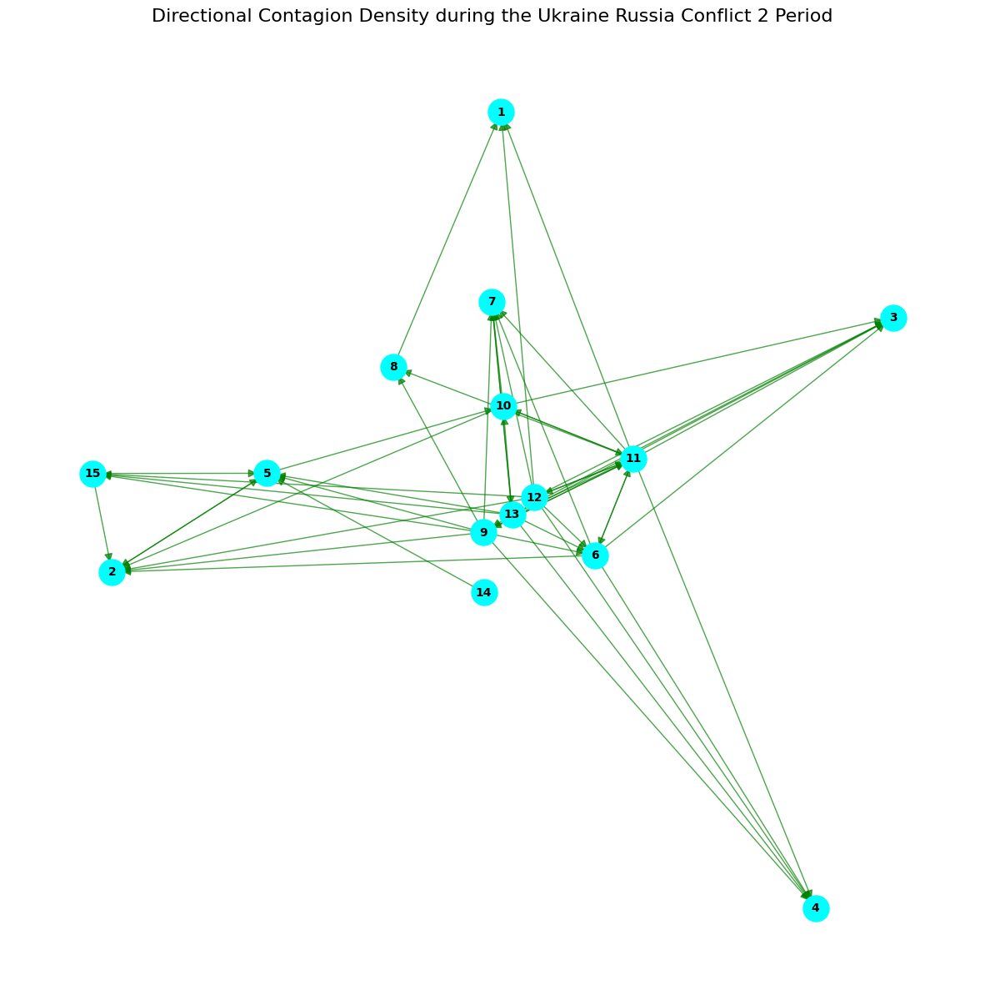

In [ ]:
density_count_dict_ped7 = contagion_cross_community_visualize(directional_density_matrix_ped7, 0.25, "Directional Contagion Density during the Ukraine Russia Conflict 2 Period", save_fig = "drive/MyDrive/Project_5/contagion/U R 2/directional_density_U_R_2.png")
density_count_dict_ped7["out_average_score"] = directional_density_matrix_ped7.sum(axis = 1)/(len(directional_density_matrix_ped7) - 1) # outbound contagion
density_count_dict_ped7["in_average_score"] = directional_density_matrix_ped7.sum(axis = 0)/(len(directional_density_matrix_ped7) - 1) # outbound contagion

In [ ]:
density_count_dict_ped7

,in_count,out_count,out_average_score,in_average_score
1,3,0,6.584777,12.024389
2,6,1,9.353184,12.789445
3,6,0,7.039648,11.699934
4,5,0,7.349420,10.397669
5,5,2,9.430847,10.525792
6,4,5,11.584772,11.152972
7,6,1,9.274086,12.245178
8,2,1,8.490140,10.909000
9,2,9,14.512330,8.582999
10,3,4,11.167784,9.772948


Figure was saved


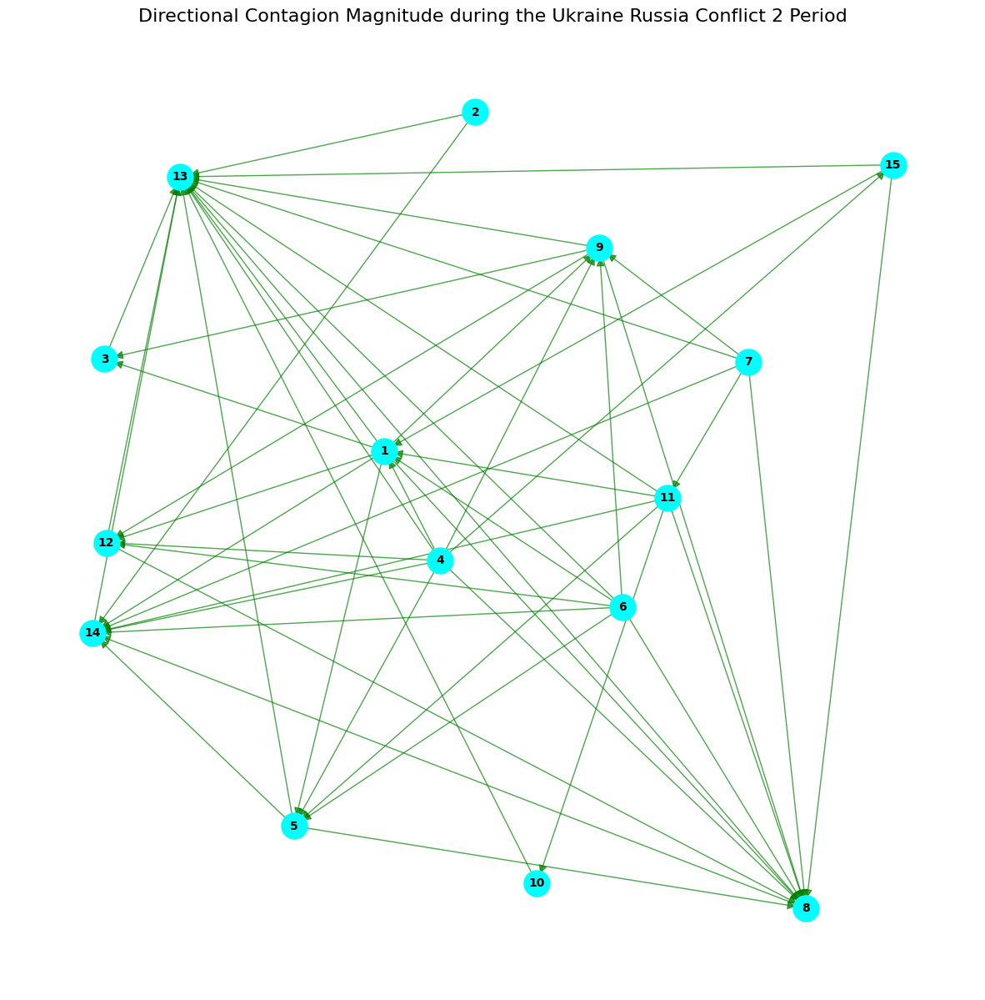

In [ ]:
magnitude_count_dict_ped7 = contagion_cross_community_visualize(contagion_magnitude_transmitter_matrix_ped7, 0.25, "Directional Contagion Magnitude during the Ukraine Russia Conflict 2 Period", save_fig = "drive/MyDrive/Project_5/contagion/U R 2/directional_magnitude_U_R_2.png")
magnitude_count_dict_ped7["out_average_score"] = contagion_magnitude_transmitter_matrix_ped7.sum(axis = 1)/(len(contagion_magnitude_transmitter_matrix_ped7) - 1) # outbound contagion
magnitude_count_dict_ped7["in_average_score"] = contagion_magnitude_transmitter_matrix_ped7.sum(axis = 0)/(len(contagion_magnitude_transmitter_matrix_ped7) - 1) # outbound contagion

New Visualization for Directional Contagion Density

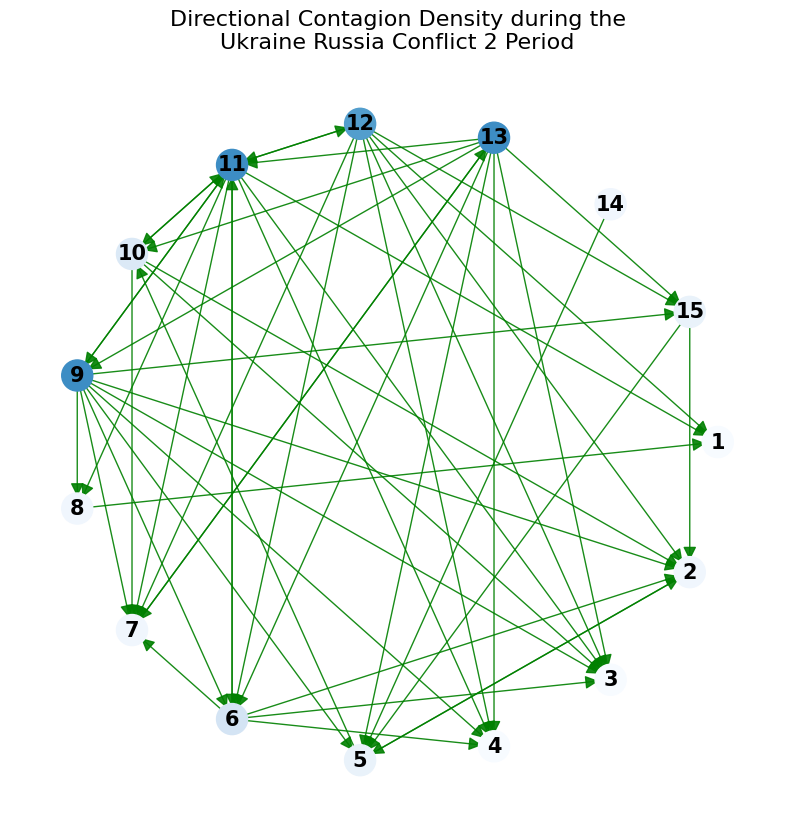

In [22]:
influence_matrix = directional_density_matrix_ped7  # Replace with your actual 17x17 matrix

n = influence_matrix.shape[0]

edges = [(i + 1, j + 1, influence_matrix[i, j])
         for i in range(n) for j in range(n) if i != j and influence_matrix[i, j] > 0]

# Step 2: Sort edges by weight descending
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)

# Step 3: Keep top 25%
num_edges_to_keep = len(edges_sorted) // 4
top_edges = edges_sorted[:num_edges_to_keep]

# Step 4: Create directed graph with top edges
G = nx.DiGraph()
G.add_nodes_from(range(1, n + 1))
for u, v, w in top_edges:
    G.add_edge(u, v, weight=w)


# Circular clockwise layout
pos = nx.circular_layout(G)
for node in pos:
    x, y = pos[node]
    pos[node] = (x, -y)

# Calculate in-degree for each node
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
max_out_degree = len(out_degrees) - 1

percent_degree = out_degrees/max_out_degree
percent_degree = [x if x > 0.5 else x/2 for x in percent_degree]

# Normalize and map to colormap
cmap = plt.cm.Blues  # Darker red = higher in-degree
node_colors = cmap(percent_degree)

plt.figure(figsize=(10, 10))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=500)
nx.draw_networkx_labels(G, pos, font_size=15, font_weight='bold')

weights = [d['weight'] for _, _, d in G.edges(data=True)]
nx.draw_networkx_edges(
    G, pos,
    edge_color='green',
    arrows=True, arrowsize=20, alpha=0.9
)

plt.title("Directional Contagion Density during the\nUkraine Russia Conflict 2 Period",fontsize=16)
plt.axis('off')

plt.savefig("directional_contagion_density_U_K_2.png", bbox_inches='tight',pad_inches = 0.1, dpi = 300)

